In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [163]:
import dowhy
from dowhy import CausalModel

In [4]:
#Death notification
data=pd.read_csv('CHAMPS.csv')

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_3310/2231883879.py:2: DtypeWarning: Columns (110,131,168,200,216) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('CHAMPS.csv')


In [127]:
#Data with decoded dataset containing documentation
data2=pd.read_csv('Decode.csv')

In [6]:
#from champ2 sent second times from Getaye....is almost same as  CHAMPS.csv 
death=pd.read_csv('Death.csv')

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_3310/2900805737.py:2: DtypeWarning: Columns (80,81,86,112,113,131,133,134,136,171,204,220) have mixed types. Specify dtype option on import or set low_memory=False.
  death=pd.read_csv('Death.csv')


In [7]:
lab=pd.read_csv('Lab.csv')

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_3310/382998590.py:1: DtypeWarning: Columns (21,40,45,46,48,49,67,72,73,76,78,80,87,92,94,99,116,127,128,129,225,235,249,271,295,296,297,298,299,300,302,320,326,335,336,337,338,339,340,341,342,343,344,345,356,366,375,376,377,378,379,380,381,382,383,384,385,396,416,422,423,427,434,445,451,462,464,465,474,475,481,482,483,485,486,487,488,489,491,492,493,502,503,509,510,511,513,514,515,516,517,519,578,579,581,582,583,585,628,632,637,658,662,671,674,675,677,678,679,681,729,730,733,734,736,737,739,756,762,763,766,768,774,854,856,877,931,1020,1057,1113,1117,1179,1181,1198,1201) have mixed types. Specify dtype option on import or set low_memory=False.
  lab=pd.read_csv('Lab.csv')


In [8]:
lab.shape

(657, 1535)

In [9]:
data.shape

(7791, 220)

In [10]:
death.shape

(5263, 224)

In [4]:
data.columns

Index(['report_id', 'report_ver_nmb', 'report_note_dt', 'report_note_time',
       'report_sex', 'report_stillbirth', 'report_age_class',
       'report_dob_known', 'idnf_dobclass', 'report_dob',
       ...
       'elig_mom_refuse___ch00056', 'elig_mom_refuse___ch00057',
       'elig_mom_refuse___ch00058', 'elig_mom_refuse___ch00059',
       'elig_mom_refuse___ch00060', 'elig_mom_refuse___ch00061',
       'elig_mom_refother', 'elig_mom_refreason', 'champs_id_preg',
       'consent_tracking_complete'],
      dtype='object', length=220)

In [137]:
#elig_preg_comp: Did you (the mother) have any complications or health problems when you (the mother) were pregnant with [report_child_firsname] (name of deceased)?
#elig_labor_comp: Did you (the mother) have any complications or health problems during the labor and birth of [report_child_firsname] (name of deceased)?
data[['elig_preg_comp','elig_labor_comp']].head(20)

,elig_preg_comp,elig_labor_comp
0,CH00001,CH00001
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
5,CH00001,CH00002
6,NaN,NaN
7,NaN,NaN
8,NaN,NaN
9,NaN,NaN


In [133]:
death['report_stillbirth']

0       CH00002
1       CH00001
2       CH00002
3       CH00002
4       CH00002
         ...   
5258    CH00002
5259    CH00002
5260    CH00002
5261    CH00002
5262    CH00002
Name: report_stillbirth, Length: 5263, dtype: object

In [83]:
data['champs_id']

0       ETAA00008
1       ETAA00017
2       ETAA00052
3       ETAA00073
4       ETAA00033
          ...    
7786          NaN
7787          NaN
7788          NaN
7789    ETAA04916
7790          NaN
Name: champs_id, Length: 7791, dtype: object

In [5]:
len(data)

7791

In [23]:
data[['report_id','report_stillbirth']]

,report_id,report_stillbirth
0,1,CH00002
1,2,CH00001
2,3,CH00002
3,4,CH00002
4,5,CH00002
...,...,...
7786,8290,CH00001
7787,8291,CH00001
7788,8292,CH00002
7789,8293,CH00002


In [25]:
#count causes of death due to stillbirth which is  CH00001 
data['report_stillbirth'].value_counts()

report_stillbirth
CH00002    4236
CH00001    3550
CH00003       1
Name: count, dtype: int64

In [26]:
data['elig_narrative']

0       The Family Mention that  they took their daugh...
1       The mother was preclamptic and had follow up a...
2       Neonate born at Harar General hospital, first ...
3       The baby was two days old from Harar. The moth...
4       Delivery at home by traditional birth attendan...
                              ...                        
7786                                                  NaN
7787                                                  NaN
7788                                                  NaN
7789    The baby was female neonate which was stay 15 ...
7790                                                  NaN
Name: elig_narrative, Length: 7791, dtype: object

In [37]:
#Child death by age
#CH01414: Death in the first 24 hours of life
#CH01415: 1 to 6 days old
#CH01416: 7 to 27 days old 
#CH01417: 28 days old to less than 12 months old 
#CH01418: 12 months old to less than 60 months old **
#CH01419: 60 months old or older 
data['report_age_class'].value_counts()

report_age_class
CH01415    1292
CH01418     951
CH01414     873
CH01417     722
CH01416     387
CH01419      12
Name: count, dtype: int64

In [ ]:
#religion of deceased child
data['report_care_religion']

In [ ]:
data['elig_gps_lat']

In [46]:
#Ethnicity of deceased child
data['elig_ethnicity_code']

0       CH01980
1       CH01980
2       CH01985
3       CH01980
4       CH01980
         ...   
7786        NaN
7787        NaN
7788        NaN
7789    CH01980
7790        NaN
Name: elig_ethnicity_code, Length: 7791, dtype: object

In [52]:
data['elig_mits']

0       CH00001
1       CH00001
2       CH00001
3       CH00001
4       CH00001
         ...   
7786        NaN
7787        NaN
7788        NaN
7789    CH00001
7790        NaN
Name: elig_mits, Length: 7791, dtype: object

In [59]:
data['mits_sex']

KeyError: 'mits_sex'

In [11]:
data2.columns

Index(['packet_version_id', 'id_ver_nmb', 'champs_id', 'dp_001', 'dp_002',
       'dp_003', 'dp_004', 'dp_005', 'dp_006', 'dp_007',
       ...
       'dpf_012___ch00040', 'dpf_012___ch00041', 'dpf_012___ch00042',
       'dpf_012___ch00043', 'dpf_012___ch01424', 'dpf_012___ch01875',
       'dpf_012___ch00010', 'dpf_013', 'dpf_014',
       'crf_060302_decode_panel_feedback_form_complete'],
      dtype='object', length=381)

In [12]:
data2.shape

(444, 381)

In [13]:
data2['champs_id']

0      ETAA00002
1      ETAA00004
2      ETAA00005
3      ETAA00008
4      ETAA00009
         ...    
439    ETAA01598
440    ETAA01600
441    ETAA01764
442    ETAA01768
443    ETAA01907
Name: champs_id, Length: 444, dtype: object

In [ ]:
# dp_013: child case type : Case Information

In [14]:
#Renaming case type values in a column to thier proper name
data2['dp_013'].replace({'CH00716': 'Stillbirth','CH01404':'Death in the first 24 hours',
                      'CH01405': 'Early Neonate (1 to 6 days)',
                     'CH01406': 'Late Neonate (7 to 27 days)' ,
                     'CH00718': 'Infant (28 days to less than 12 months)' ,
                     'CH00719': 'Child (12 months to less than 60 months)' },inplace=True)

In [720]:
#Note that each of the cause type will be used as target of analysis to identify most common cause/factor for each type

deathbycase=round(data2['dp_013'].value_counts()/len(data2)*100,2)
deathbycase

dp_013
Stillbirth                                  53.83
Death in the first 24 hours                 15.54
Early Neonate (1 to 6 days)                 11.04
Child (12 months to less than 60 months)     9.46
Infant (28 days to less than 12 months)      6.08
Late Neonate (7 to 27 days)                  4.05
Name: count, dtype: float64

<AxesSubplot: ylabel='dp_013'>

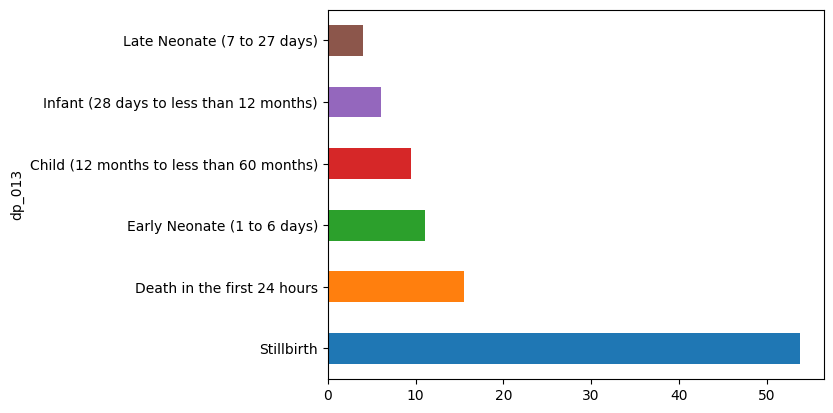

In [16]:
deathbycase.plot.barh(color=["#1f77b4", "#ff7f0e", 
                "#2ca02c", "#d62728", "#9467bd", 
                "#8c564b"])


In [721]:
#Sort firts and plot in  descending order
deathbycasesorted=deathbycase.sort_values(ascending=True)

Text(0, 0.5, 'causes of Death')

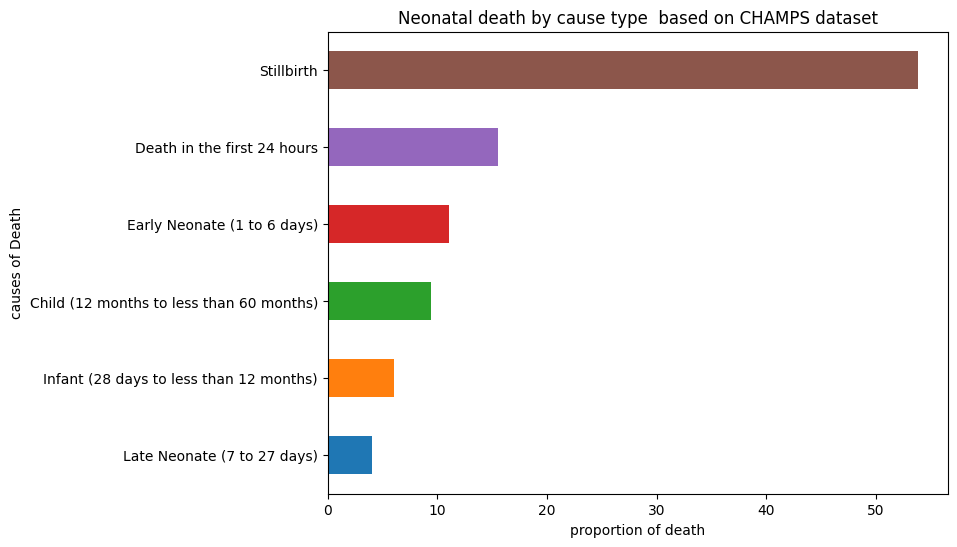

In [751]:
plt.figure(figsize=(8,6))
plt.title("Neonatal death by cause type  based on CHAMPS dataset")
deathbycasesorted.plot.barh(color=["#1f77b4", "#ff7f0e", 
                "#2ca02c", "#d62728", "#9467bd", 
                "#8c564b"])
plt.xlabel('proportion of death')
plt.ylabel('causes of Death')

In [752]:
casetype1=pd.DataFrame(deathbycasesorted)

In [762]:
casetype=pd.read_csv('casetype.csv')
casetype=casetype.sort_values(ascending=False, by='Proportion')

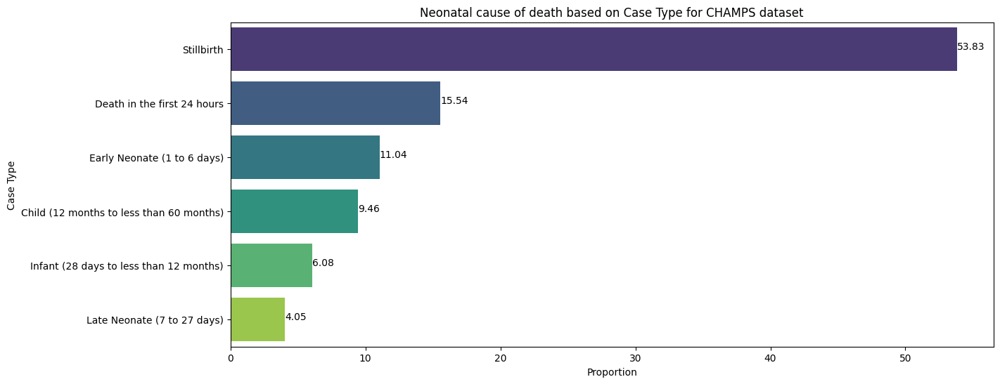

In [768]:
plt.figure(figsize=(14,6))
sns.barplot(casetype, x="Proportion", y="Case Type",palette='viridis').set_title('Neonatal cause of death based on Case Type for CHAMPS dataset')
y=casetype['Proportion']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

In [17]:
#Identify correlation factors from dp_108(infant main cause of death) and maternal cause(dp_118) for each cause type
#Note: that you can use hotencoder to expand each column of infant and mother cause to see the correlation and feature importance
#to each cause type. Also visualize using the  the HITMAP
#when doing this correlation give the target variable for instannce stillbirth=1 and others=0 and turn by turn for each casetype
#so that you can analyze the effect of any variable on each
data2[['dp_013','dp_108','dp_118']].head(10)

,dp_013,dp_108,dp_118
0,Stillbirth,Undetermined,Undetermined
1,Stillbirth,Undetermined,Undetermined
2,Stillbirth,Intrauterine hypoxia,Abruption placenta
3,Child (12 months to less than 60 months),Severe acute malnutrition,NaN
4,Late Neonate (7 to 27 days),Sepsis,NaN
5,Child (12 months to less than 60 months),Pneumonia,NaN
6,Infant (28 days to less than 12 months),Pneumonia,NaN
7,Stillbirth,Intrauterine hypoxia,Abruption placenta
8,Stillbirth,Intrauterine hypoxia,Uterine rupture
9,Death in the first 24 hours,Respiratory distress syndrome,Eclampsia


In [18]:
data2['dp_108'].unique()

array(['Undetermined', 'Intrauterine hypoxia',
       'Severe acute malnutrition', 'Sepsis', 'Pneumonia',
       'Respiratory distress syndrome', 'Birth asphyxia',
       'Low birth weight', 'Chromosomal abnormality', 'Preterm',
       'Intrauterine growth restriction', 'Meconium aspiration syndrome',
       'Gastroenteritis', 'Hydrocephalus', 'Neural tube defect',
       'Hydrops fetalis', 'Measles', 'Congenital malformation ',
       'Neonatal jaundice', 'Polycystic kidney disease',
       'Craniorachischisis', 'RH isoimmuzation', 'Portal Hypertension',
       'Pneumonitis',
       'Infections of the skin and other subcutaneous tissue',
       'Accidental suffocation and strangulation in bed',
       'Extreme immaturity', 'Iniencephaly',
       'Unspecified parasitic disease ', 'Intrauterine infection ',
       'Osteochondrodysplasia with defects of growth of tubular bones and spine',
       'Light for Gestational Age ',
       'Hypoxic Ischemic Encephalopathy of Newborn '], dtype=ob

In [19]:
neonatalCOD=round(data2['dp_108'].value_counts()/len(data2) *100,2)

In [21]:
len(neonatalCOD)

33

In [22]:
neonatalCOD.head(35)

dp_108
Intrauterine hypoxia                                                       35.36
Severe acute malnutrition                                                   9.68
Birth asphyxia                                                              7.43
Undetermined                                                                6.31
Respiratory distress syndrome                                               4.50
Sepsis                                                                      4.28
Neural tube defect                                                          4.28
Preterm                                                                     3.83
Craniorachischisis                                                          3.83
Intrauterine growth restriction                                             2.93
Pneumonia                                                                   2.70
Low birth weight                                                            2.25
Hydrocephalus        

In [24]:
#sort the cause of death in Descending order
sortedneonateCOD=neonatalCOD.sort_values(ascending=True)

<AxesSubplot: ylabel='dp_108'>

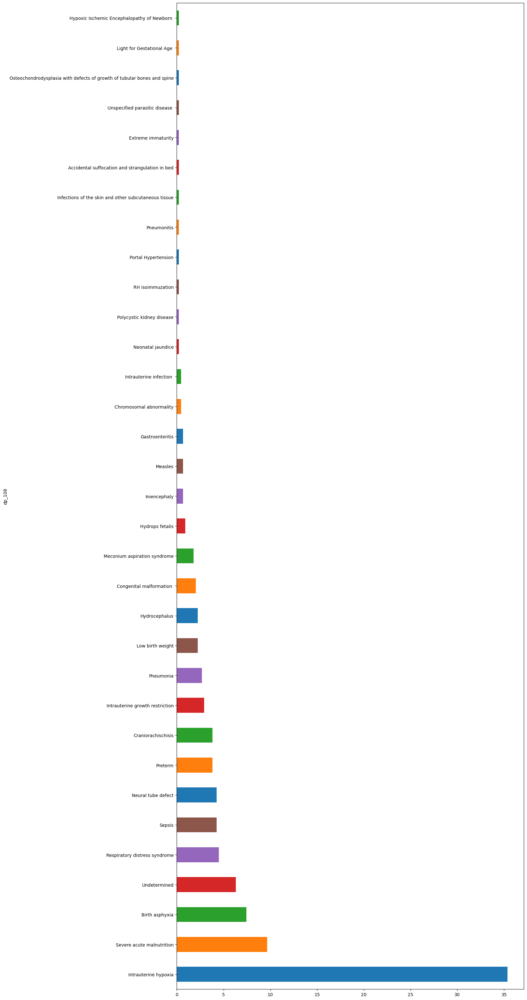

In [25]:
plt.figure(figsize=(14,40))
neonatalCOD.plot.barh(color=["#1f77b4", "#ff7f0e", 
                "#2ca02c", "#d62728", "#9467bd", 
                "#8c564b"])

Text(0, 0.5, 'causes of Death')

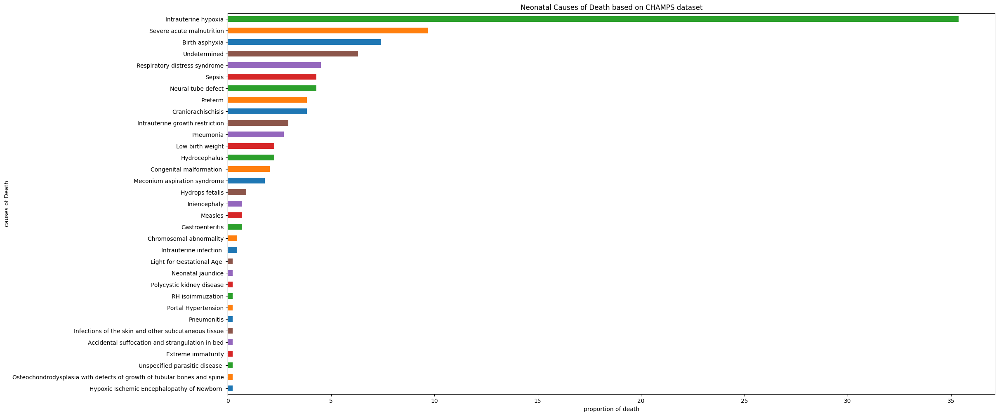

In [779]:
plt.figure(figsize=(24,12))
plt.title("Infant factors for Neonatal Causes of Death based on CHAMPS dataset")
sortedneonateCOD.plot.barh(color=["#1f77b4", "#ff7f0e", 
                "#2ca02c", "#d62728", "#9467bd", 
                "#8c564b"])
plt.xlabel('proportion of death')
plt.ylabel('causes of Death')

In [18]:
neonatalCOD.to_csv('CODNenatal.csv',index=True)

In [19]:
#maternal disease or condition affecting fetus or infant
#dp_162: Should the main maternal disease /condition be considered as the Underlying Cause?
#dp_118: Main Maternal Disease/Condition  affecting fetus or infant
#dp_120: dp_121,dp_122,dp_123,Other Maternal Disease/Condition
#dp_108: Underlying cause or factor/ Main condition in fetus or infant 
data2[['dp_108','dp_162','dp_118','dp_120','dp_121','dp_122','dp_123']].head(30)

,dp_108,dp_162,dp_118,dp_120,dp_121,dp_122,dp_123
0,Undetermined,CH00002,Undetermined,NaN,NaN,NaN,NaN
1,Undetermined,CH00002,Undetermined,NaN,NaN,NaN,NaN
2,Intrauterine hypoxia,CH00002,Abruption placenta,NaN,NaN,NaN,NaN
3,Severe acute malnutrition,NaN,NaN,NaN,NaN,NaN,NaN
4,Sepsis,NaN,NaN,NaN,NaN,NaN,NaN
5,Pneumonia,NaN,NaN,NaN,NaN,NaN,NaN
6,Pneumonia,NaN,NaN,NaN,NaN,NaN,NaN
7,Intrauterine hypoxia,CH00002,Abruption placenta,Preeclampsia,NaN,NaN,NaN
8,Intrauterine hypoxia,CH00002,Uterine rupture,"Fetus affected by malpresentation (face), malp...",NaN,NaN,NaN
9,Hyaline membrane disease,CH00002,Eclampsia,NaN,NaN,NaN,NaN


In [ ]:
#dp_118:Main maternal disease condition affecting the child/fetus 

In [27]:
maternalcon=round(data2['dp_118'].value_counts()/len(data2)*100,2)
#neonatalCOD=round(data2['dp_108'].value_counts()/len(data2) *100,2)

In [28]:
len(maternalcon)

28

In [29]:
maternalcon.head(30)

dp_118
Preeclampsia                                       9.01
Abruption placenta                                 9.01
Multiple pregnancy                                 4.73
Preterm rupture of membranes                       2.93
Malpresentation, malposition, and disproportion    2.70
Eclampsia                                          2.48
Antepartum hemorrhage                              1.58
Cord prolapse                                      1.58
Chorioamnionitis                                   1.13
Preterm labour                                     1.13
Breech presentation                                1.13
Uterine rupture                                    0.90
placental infarction                               0.90
Placenta previa                                    0.68
Hypertensive disorder                              0.68
Undetermined                                       0.68
diabetes mellitus                                  0.45
Obstructed labor                         

In [30]:
sortedmaterfactor=maternalcon.sort_values(ascending=True)

<AxesSubplot: ylabel='dp_118'>

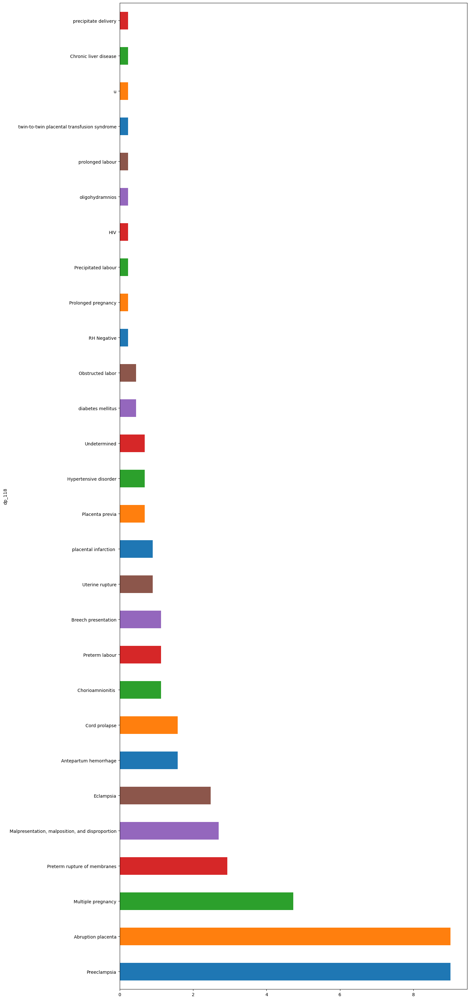

In [31]:
plt.figure(figsize=(14,40))
maternalcon.plot.barh(color=["#1f77b4", "#ff7f0e", 
                "#2ca02c", "#d62728", "#9467bd", 
                "#8c564b"])

Text(0, 0.5, 'Maternal factors')

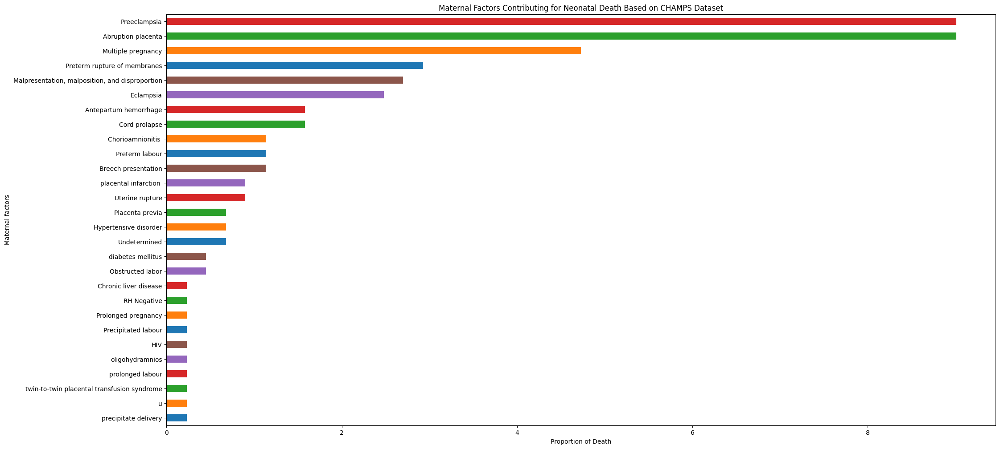

In [780]:
plt.figure(figsize=(24,12))
plt.title('Maternal Factors Contributing for Neonatal Death Based on CHAMPS Dataset')
sortedmaterfactor.plot.barh(color=["#1f77b4", "#ff7f0e", 
                "#2ca02c", "#d62728", "#9467bd", 
                "#8c564b"])
plt.xlabel('Proportion of Death')
plt.ylabel('Maternal factors')

In [33]:
maternalcon

dp_118
Preeclampsia                                       9.01
Abruption placenta                                 9.01
Multiple pregnancy                                 4.73
Preterm rupture of membranes                       2.93
Malpresentation, malposition, and disproportion    2.70
Eclampsia                                          2.48
Antepartum hemorrhage                              1.58
Cord prolapse                                      1.58
Chorioamnionitis                                   1.13
Preterm labour                                     1.13
Breech presentation                                1.13
Uterine rupture                                    0.90
placental infarction                               0.90
Placenta previa                                    0.68
Hypertensive disorder                              0.68
Undetermined                                       0.68
diabetes mellitus                                  0.45
Obstructed labor                         

In [28]:
maternalcon.to_csv('maternalfactor.csv',index=True)

In [29]:
data2['dp_110'].tail(30)

414        NaN
415        NaN
416        NaN
417        NaN
418    CH00170
419        NaN
420        NaN
421        NaN
422        NaN
423    CH00174
424        NaN
425        NaN
426        NaN
427        NaN
428        NaN
429        NaN
430        NaN
431        NaN
432        NaN
433        NaN
434        NaN
435    CH00158
436        NaN
437        NaN
438        NaN
439        NaN
440        NaN
441        NaN
442        NaN
443        NaN
Name: dp_110, dtype: object

In [30]:
lab.columns

Index(['champs_id', 'vr_numb', 'disp_transportneeded', 'disp_body_loc',
       'disp_notes', 'disp_body_date', 'disp_body_time', 'disp_transport_time',
       'disp_deliver_date', 'disp_deliver_time',
       ...
       'lung_org_ch00604_4id', 'lung_orgcode_ch00604_4',
       'lung_orgother_ch00604_4', 'lung_isolate_ch00604_4',
       'lung_org_ch00604_5id', 'lung_orgcode_ch00604_5',
       'lung_orgother_ch00604_5', 'lung_isolate_ch00604_5',
       'lung_comment_ch00603', 'lung_microbiology_results_complete'],
      dtype='object', length=1535)

In [31]:
# date of death: mits_dod_dt
#sex: mits_sex
#mits_stillbirth: is still birth

lab[['champs_id','mits_stillbirth','mits_dod_dt','mits_sex','ch00845_ch00858']]

,champs_id,mits_stillbirth,mits_dod_dt,mits_sex,ch00845_ch00858
0,ETAA00002,CH00606,09/02/2019,CH00030,NaN
1,ETAA00004,CH00606,09/02/2019,CH00031,CH00002
2,ETAA00005,CH00605,14/02/2019,CH00031,CH00002
3,ETAA00008,CH00608,20/02/2019,CH00031,CH00002
4,ETAA00017,CH00605,12/02/2019,CH00030,CH00002
...,...,...,...,...,...
652,ETAA02888,CH00605,30/09/2022,CH00031,NaN
653,ETAA02892,CH00605,27/09/2022,CH00031,NaN
654,ETAA02896,NaN,23/09/2022,CH00030,NaN
655,ETAA02898,NaN,21/09/2022,CH00031,NaN


In [32]:
len(lab) 

657

In [33]:
#underlying cause
data2[['dp_108','dp_110']].head(40)

,dp_108,dp_110
0,Undetermined,NaN
1,Undetermined,NaN
2,Intrauterine hypoxia,NaN
3,Severe acute malnutrition,NaN
4,Sepsis,NaN
5,Pneumonia,NaN
6,Pneumonia,NaN
7,Intrauterine hypoxia,NaN
8,Intrauterine hypoxia,NaN
9,Hyaline membrane disease,NaN


In [ ]:
#all etiology agents from 110---115

In [34]:
data2[['dp_108','dp_110','dp_111','dp_112','dp_113','dp_114','dp_115']].head(30)

,dp_108,dp_110,dp_111,dp_112,dp_113,dp_114,dp_115
0,Undetermined,NaN,NaN,NaN,NaN,NaN,NaN
1,Undetermined,NaN,NaN,NaN,NaN,NaN,NaN
2,Intrauterine hypoxia,NaN,NaN,NaN,NaN,NaN,NaN
3,Severe acute malnutrition,NaN,NaN,NaN,NaN,NaN,NaN
4,Sepsis,NaN,NaN,NaN,NaN,NaN,NaN
5,Pneumonia,NaN,NaN,NaN,NaN,NaN,NaN
6,Pneumonia,NaN,NaN,NaN,NaN,NaN,NaN
7,Intrauterine hypoxia,NaN,NaN,NaN,NaN,NaN,NaN
8,Intrauterine hypoxia,NaN,NaN,NaN,NaN,NaN,NaN
9,Hyaline membrane disease,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#morbidity

In [35]:
data2[['dp_028','dp_038','dp_048','dp_058','dp_068','dp_078','dp_088','dp_098','dp_030']]

,dp_028,dp_038,dp_048,dp_058,dp_068,dp_078,dp_088,dp_098,dp_030
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Disseminated intravascular coagulation,Pneumonia,Anemia,Submandibular adenitis,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Lab Practice
#champs_id: Champs Id
#mits_dod_dt: Date of Death
#mits_location: Location where MITS performed
#ch00808_ch00807: Weigh measurement
#mits_sex: Sex
#mits_stillbirth: If still birth
#ch00814_ch00818: Umblical abnormal
#ch00815_ch00820: Hepatomegaly
#ch00816_ch00822:Jaundice/icterus
#ch00841_ch00083:Cerebrospinal fluid

In [36]:
lab[['champs_id','mits_dod_dt','mits_location','ch00808_ch00807','mits_sex',
     'mits_stillbirth','ch00814_ch00818','ch00815_ch00820','ch00841_ch00083']].head(5)

,champs_id,mits_dod_dt,mits_location,ch00808_ch00807,mits_sex,mits_stillbirth,ch00814_ch00818,ch00815_ch00820,ch00841_ch00083
0,ETAA00002,09/02/2019,CH02002,1.01,CH00030,CH00606,CH00002,CH00576,CH00001
1,ETAA00004,09/02/2019,CH02002,0.75,CH00031,CH00606,CH00001,CH00576,CH00001
2,ETAA00005,14/02/2019,CH02002,1.70,CH00031,CH00605,CH00002,CH00576,CH00001
3,ETAA00008,20/02/2019,CH02002,6.70,CH00031,CH00608,CH00002,CH00001,CH00001
4,ETAA00017,12/02/2019,CH02002,1.37,CH00030,CH00605,CH00002,CH00002,CH00001


In [ ]:
#Clinical Lab result
#test_code_ch00273: Malaria Rapid Test
#result_ch00273: Malaria Test Result
#not_done_ch00273: Reasone not tested...if ch00273 is equal to ch00206
#species_ch00273: Malaria Species identified

#test_code_ch00274:Malaria Thick Smear Blood
#result_ch00274: Test result
#test_code_ch00276:HIV testing

In [37]:
lab[['test_code_ch00273','result_ch00273','not_done_ch00273','species_ch00273',
     'test_code_ch00274','result_ch00274','test_code_ch00276','result_ch00276']].head(5)

,test_code_ch00273,result_ch00273,not_done_ch00273,species_ch00273,test_code_ch00274,result_ch00274,test_code_ch00276,result_ch00276
0,CH00273,CH00206,CH00217,NaN,CH00274,CH00206,CH00276,CH00180
1,CH00273,CH00180,NaN,NaN,CH00274,CH00206,CH00276,CH00180
2,CH00273,CH00180,NaN,NaN,CH00274,CH00180,CH00276,CH00180
3,CH00273,CH00180,NaN,NaN,CH00274,CH00180,CH00276,CH00180
4,CH00273,CH00180,NaN,NaN,CH00274,CH00180,CH00276,CH00180


In [128]:
#Here we start data preparation for modeling
#Take a back of data2
data4=data2.copy()

In [35]:
len(data4)

444

In [129]:
data4=pd.get_dummies(data4, columns=['dp_108'],prefix='Infant')

In [130]:
data4=pd.get_dummies(data4, columns=['dp_118'],prefix='Maternal')

In [131]:
data4=pd.get_dummies(data4, columns=['dp_013'],prefix='DeathType')

In [132]:
data4.columns

Index(['packet_version_id', 'id_ver_nmb', 'champs_id', 'dp_001', 'dp_002',
       'dp_003', 'dp_004', 'dp_005', 'dp_006', 'dp_007',
       ...
       'Maternal_precipitate delivery', 'Maternal_prolonged labour',
       'Maternal_twin-to-twin placental transfusion syndrome', 'Maternal_u',
       'DeathType_CH00716', 'DeathType_CH00718', 'DeathType_CH00719',
       'DeathType_CH01404', 'DeathType_CH01405', 'DeathType_CH01406'],
      dtype='object', length=445)

In [43]:
data4.shape

(444, 445)

In [102]:
data3.isnull().sum()

packet_version_id                                    0
id_ver_nmb                                           0
champs_id                                            0
dp_001                                               0
dp_002                                               0
                                                    ..
DeathType_Death in the first 24 hours                0
DeathType_Early Neonate (1 to 6 days)                0
DeathType_Infant (28 days to less than 12 months)    0
DeathType_Late Neonate (7 to 27 days)                0
DeathType_Stillbirth                                 0
Length: 446, dtype: int64

In [190]:
data4

,packet_version_id,id_ver_nmb,champs_id,dp_001,dp_002,dp_003,dp_004,dp_005,dp_006,dp_007,...,Maternal_precipitate delivery,Maternal_prolonged labour,Maternal_twin-to-twin placental transfusion syndrome,Maternal_u,DeathType_Child (12 months to less than 60 months),DeathType_Death in the first 24 hours,DeathType_Early Neonate (1 to 6 days),DeathType_Infant (28 days to less than 12 months),DeathType_Late Neonate (7 to 27 days),DeathType_Stillbirth
0,ETAA00002_01_01,2.0.0,ETAA00002,5,1,2,3,4.0,5.0,6.0,...,False,False,False,False,False,False,False,False,False,True
1,ETAA00004_01_02,2.0.0,ETAA00004,5,1,2,3,4.0,5.0,6.0,...,False,False,False,False,False,False,False,False,False,True
2,ETAA00005_01_02,2.0.0,ETAA00005,5,1,2,3,4.0,5.0,6.0,...,False,False,False,False,False,False,False,False,False,True
3,ETAA00008_01_04,2.0.0,ETAA00008,5,1,2,3,4.0,5.0,6.0,...,False,False,False,False,True,False,False,False,False,False
4,ETAA00009_01_01,2.0.0,ETAA00009,5,18,19,20,21.0,7.0,NaN,...,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,ETAA01598_01_01,2.0.0,ETAA01598,5,2,3,4,5.0,7.0,11.0,...,False,False,False,False,False,False,False,False,False,True
440,ETAA01600_01_01,2.0.0,ETAA01600,5,18,19,14,NaN,NaN,NaN,...,False,False,False,False,False,True,False,False,False,False
441,ETAA01764_01_01,2.0.0,ETAA01764,5,18,19,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,True,False,False
442,ETAA01768_01_01,2.0.0,ETAA01768,5,18,19,NaN,NaN,NaN,NaN,...,False,False,False,False,True,False,False,False,False,False


In [45]:
AphixiaCauses=data4[['Infant_Congenital malformation ',"Infant_Intrauterine hypoxia",'Maternal_Hypertensive disorder',
               'Infant_Neural tube defect','Infant_Pneumonia','Maternal_Preeclampsia','Maternal_Abruption placenta',
               'Maternal_Multiple pregnancy','Maternal_Cord prolapse','Maternal_Preterm labour','Maternal_Prolonged pregnancy',
               'Maternal_Placenta previa','Maternal_Malpresentation, malposition, and disproportion','Maternal_Uterine rupture','Maternal_Breech presentation','Infant_Birth asphyxia'
              ]]

In [46]:
AphixiaCauses.corr()

,Infant_Congenital malformation,Infant_Intrauterine hypoxia,Maternal_Hypertensive disorder,Infant_Neural tube defect,Infant_Pneumonia,Maternal_Preeclampsia,Maternal_Abruption placenta,Maternal_Multiple pregnancy,Maternal_Cord prolapse,Maternal_Preterm labour,Maternal_Prolonged pregnancy,Maternal_Placenta previa,"Maternal_Malpresentation, malposition, and disproportion",Maternal_Uterine rupture,Maternal_Breech presentation,Infant_Birth asphyxia
Infant_Congenital malformation,1.000000,-0.106386,-0.011864,-0.030413,-0.023973,-0.045260,-0.045260,-0.032049,-0.018205,-0.015351,-0.006834,-0.011864,-0.023973,-0.013715,-0.015351,-0.040758
Infant_Intrauterine hypoxia,-0.106386,1.000000,0.111515,-0.156384,-0.123270,0.178622,0.293800,-0.098218,0.171119,-0.078934,-0.035140,0.111515,0.109137,0.029196,0.055002,-0.209578
Maternal_Hypertensive disorder,-0.011864,0.111515,1.000000,-0.017439,-0.013746,-0.025953,-0.025953,-0.018377,-0.010439,-0.008802,-0.003919,-0.006803,-0.013746,-0.007864,-0.008802,-0.023371
Infant_Neural tube defect,-0.030413,-0.156384,-0.017439,1.000000,-0.035240,-0.066531,-0.066531,-0.047111,-0.026760,-0.022565,-0.010046,-0.017439,-0.035240,-0.020160,0.082897,-0.059913
Infant_Pneumonia,-0.023973,-0.123270,-0.013746,-0.035240,1.000000,-0.052443,-0.052443,-0.037135,-0.021094,-0.017787,-0.007919,-0.013746,-0.027778,-0.015891,-0.017787,-0.047226
Maternal_Preeclampsia,-0.045260,0.178622,-0.025953,-0.066531,-0.052443,1.000000,-0.099010,-0.070110,-0.039824,-0.033581,-0.014950,-0.025953,-0.052443,-0.030002,-0.033581,0.000811
Maternal_Abruption placenta,-0.045260,0.293800,-0.025953,-0.066531,-0.052443,-0.099010,1.000000,-0.070110,-0.039824,-0.033581,-0.014950,-0.025953,-0.052443,-0.030002,-0.033581,0.000811
Maternal_Multiple pregnancy,-0.032049,-0.098218,-0.018377,-0.047111,-0.037135,-0.070110,-0.070110,1.000000,-0.028200,-0.023779,-0.010586,-0.018377,-0.037135,-0.021244,-0.023779,-0.063136
Maternal_Cord prolapse,-0.018205,0.171119,-0.010439,-0.026760,-0.021094,-0.039824,-0.039824,-0.028200,1.000000,-0.013507,-0.006013,-0.010439,-0.021094,-0.012067,-0.013507,-0.035863
Maternal_Preterm labour,-0.015351,-0.078934,-0.008802,-0.022565,-0.017787,-0.033581,-0.033581,-0.023779,-0.013507,1.000000,-0.005071,-0.008802,-0.017787,-0.010176,-0.011390,-0.030240


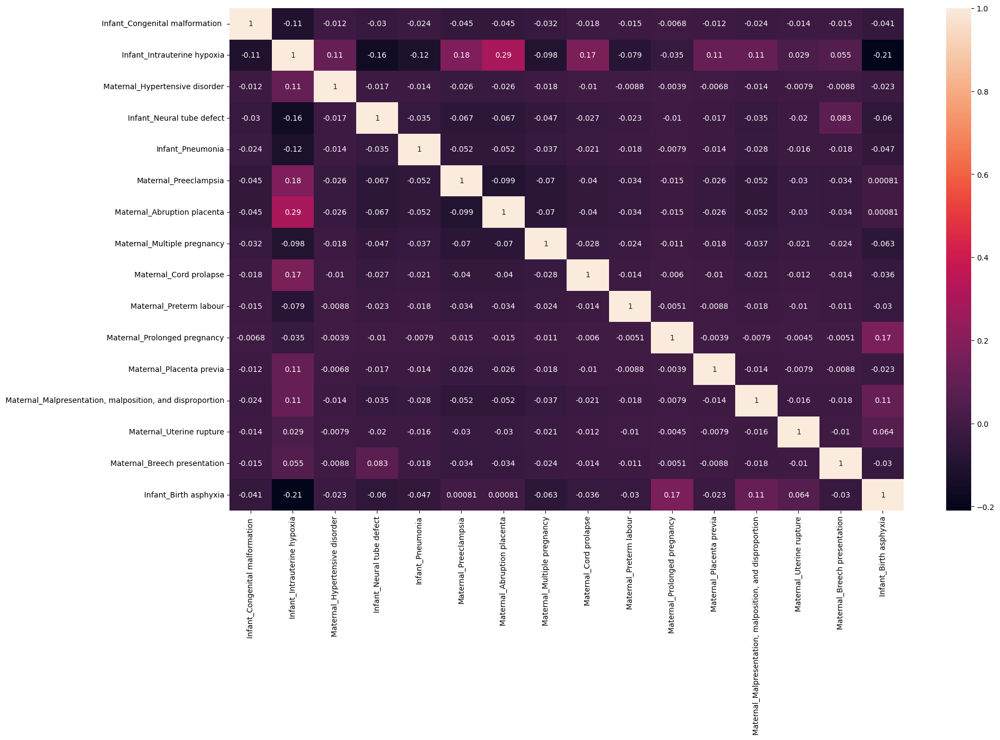

In [187]:
plt.figure(figsize=(20,12))
g= sns.heatmap(AphixiaCauses.corr(),annot=True)

In [145]:
RDS_cause=data4[['Maternal_Preeclampsia','Maternal_Multiple pregnancy',
                 'Maternal_diabetes mellitus','Maternal_Hypertensive disorder',
                'Maternal_Preterm rupture of membranes','Maternal_Abruption placenta','Infant_Preterm','Infant_Meconium aspiration syndrome',
                 'Infant_Congenital malformation ',
                 'Infant_Intrauterine growth restriction',
                 'Maternal_Malpresentation, malposition, and disproportion',
                'Infant_Respiratory distress syndrome']]

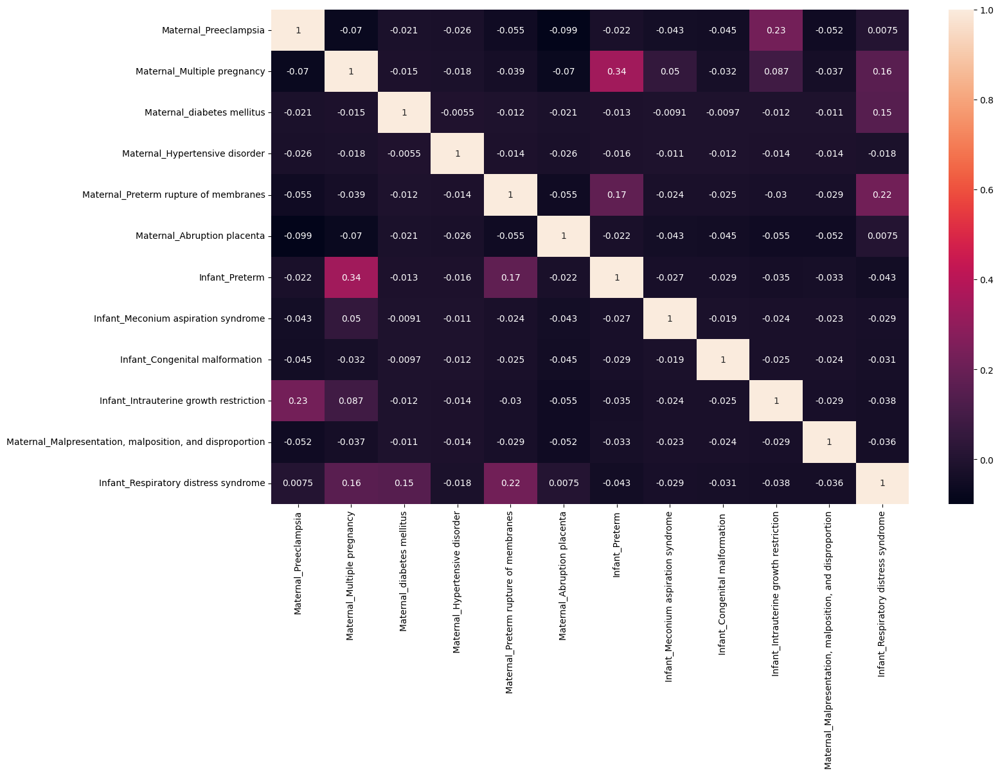

In [129]:
plt.figure(figsize=(16,10))
g= sns.heatmap(RDS_cause.corr(),annot=True)

In [147]:
Sepsis_cause=data4[['Maternal_Preeclampsia','Maternal_Multiple pregnancy',
                 'Maternal_diabetes mellitus','Maternal_Hypertensive disorder',
                'Maternal_Abruption placenta','Infant_Birth asphyxia','Infant_Respiratory distress syndrome',
                'Infant_Pneumonia','Infant_Preterm','Infant_Meconium aspiration syndrome','Maternal_Preterm rupture of membranes',
                'Infant_Low birth weight','Infant_Meconium aspiration syndrome','Infant_Intrauterine infection ','Infant_Sepsis'
                ]]

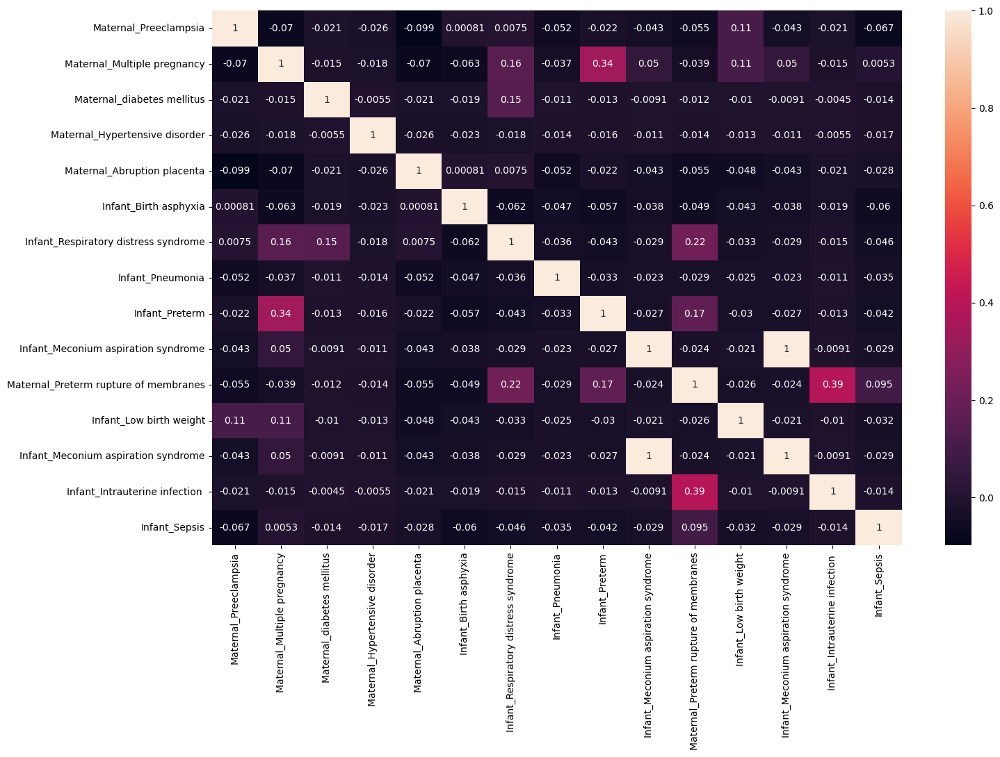

In [148]:
plt.figure(figsize=(16,10))
g= sns.heatmap(Sepsis_cause.corr(),annot=True)

In [161]:
neonatalCOD
#maternalcon

dp_108
Intrauterine hypoxia                                                       35.36
Severe acute malnutrition                                                   9.68
Birth asphyxia                                                              7.43
Undetermined                                                                6.31
Respiratory distress syndrome                                               4.50
Sepsis                                                                      4.28
Neural tube defect                                                          4.28
Preterm                                                                     3.83
Craniorachischisis                                                          3.83
Intrauterine growth restriction                                             2.93
Pneumonia                                                                   2.70
Low birth weight                                                            2.25
Hydrocephalus        

In [149]:
from sklearn.ensemble import RandomForestClassifier

In [150]:
rf=RandomForestClassifier()

In [173]:
model=rf.fit(AphixiaFeature,y)

/var/folders/cz/fk8gczx52ss7yswk1p4l28km0000gn/T/ipykernel_69059/3497537570.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model=rf.fit(AphixiaFeature,y)


In [189]:
model.score(AphixiaFeature,y)

0.9617117117117117

In [182]:
feature_scores = pd.Series(model.feature_importances_, index=AphixiaFeature.columns).sort_values(ascending=False)
feature_scores


Infant_Intrauterine hypoxia                                                       0.187137
Maternal_Malpresentation, malposition, and disproportion                          0.059158
Infant_Respiratory distress syndrome                                              0.046090
Infant_Hydrocephalus                                                              0.042299
Maternal_Abruption placenta                                                       0.042137
Infant_Intrauterine growth restriction                                            0.041053
Maternal_precipitate delivery                                                     0.039946
Infant_Low birth weight                                                           0.039526
Maternal_Preeclampsia                                                             0.037400
Maternal_Obstructed labor                                                         0.036738
Infant_Sepsis                                                                     0.033935

<AxesSubplot: >

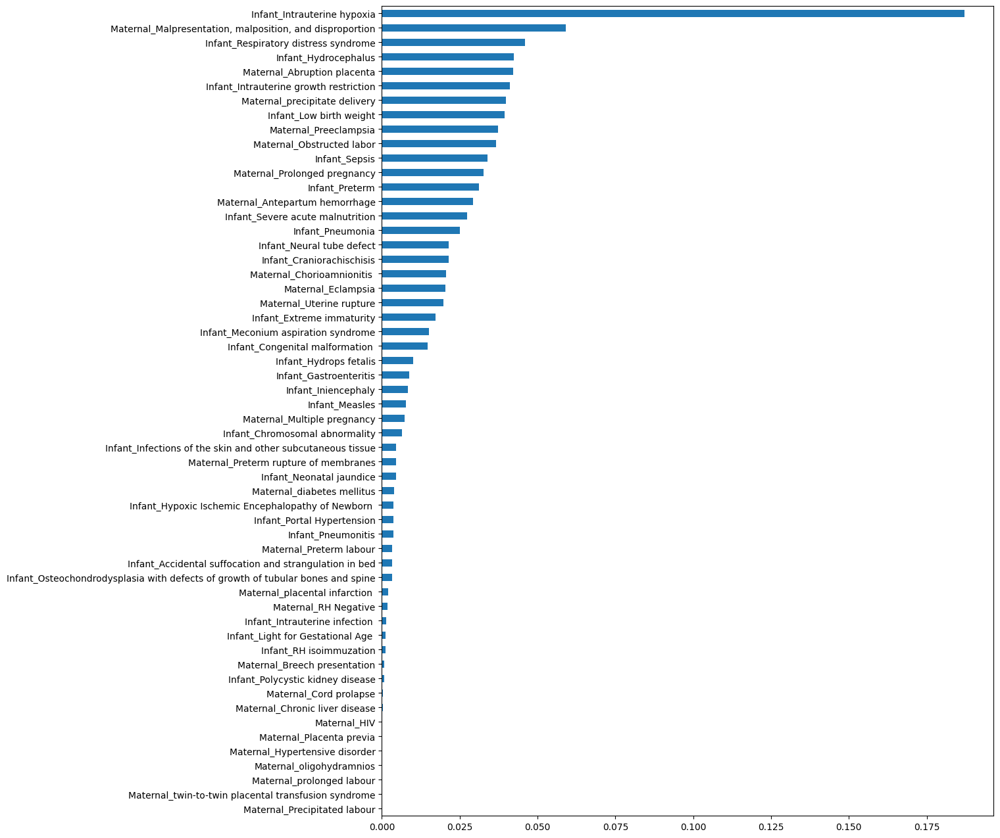

In [184]:
#Sort and and plot the features in ascending order
SortedAphixiaF=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
SortedAphixiaF.plot.barh()

In [57]:
import xgboost as xgb

In [61]:
xBoostmodel = xgb.XGBClassifier(learning_rate=0.01, n_estimators=140, max_depth=4,
 min_child_weight=6, gamma=0, subsample=0.85, colsample_bytree=0.75,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27,reg_alpha=0)

In [62]:
xBoost=xgb.XGBClassifier()

In [64]:
xgbAPhixia=xBoostmodel.fit(AphixiaXGB,y)

In [65]:
xgbAPhixia.score(AphixiaXGB,y)

0.9256756756756757

In [66]:
xBoostplain=xBoost.fit(AphixiaXGB,y)

In [68]:
xBoostplain.score(AphixiaXGB,y)

0.9301801801801802

In [ ]:
#There fore we select the xgBoost with out optimization with default parameter

In [83]:
#Feature Engineering
AphixiaXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Severe acute malnutrition",                                                   
"Infant_Sepsis",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Respiratory distress syndrome",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery"]]

y=data4[['Infant_Birth asphyxia']]

In [84]:
#Aphixia feature engineering
AphixiaModel=xBoost.fit(AphixiaXGB,y)

<AxesSubplot: >

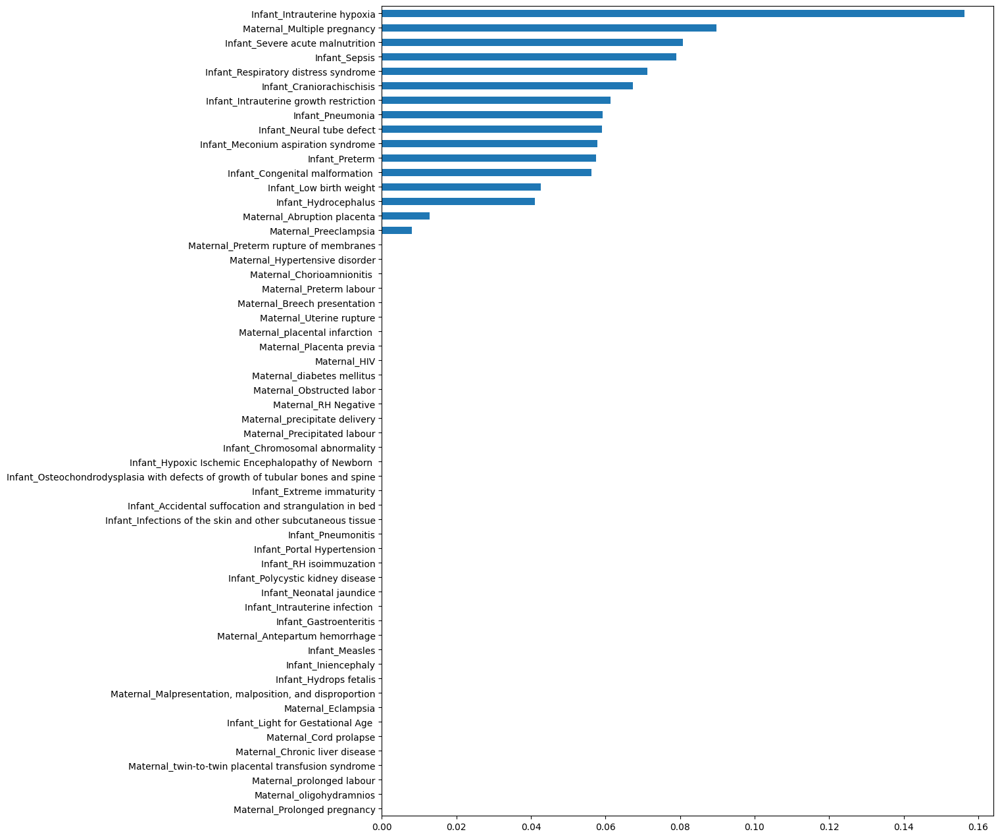

In [88]:
feature_scores = pd.Series(AphixiaModel.feature_importances_, index=AphixiaXGB.columns).sort_values(ascending=False)
AphxSorted=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
AphxSorted.plot.barh()

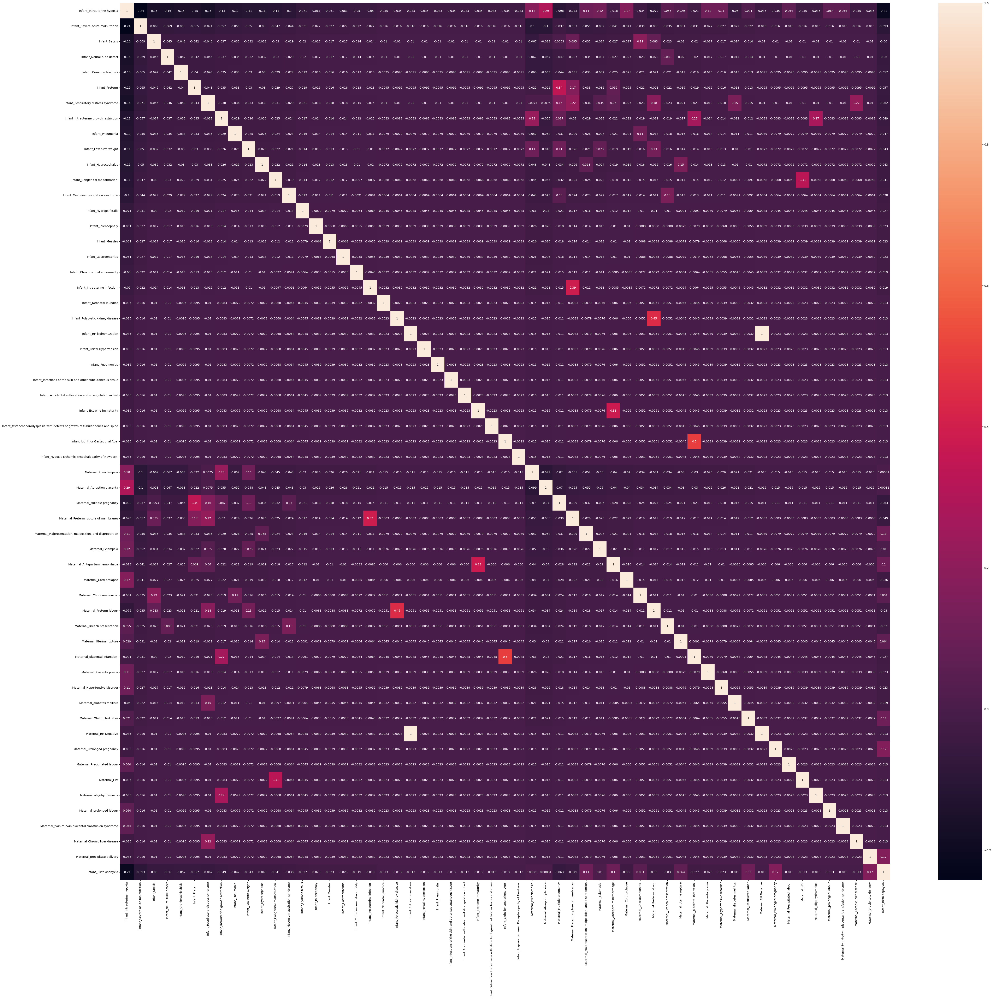

In [93]:
#Aphixia Correlation and Heatmap
plt.figure(figsize=(60,55))
g= sns.heatmap(AphixiaXGB.corr(),annot=True)

In [91]:
AphixiaXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Severe acute malnutrition",                                                   
"Infant_Sepsis",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Respiratory distress syndrome",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Birth asphyxia"]]

In [94]:
#Feature Engineering
RDSXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Severe acute malnutrition",                                                   
"Infant_Sepsis",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery"]]

y=data4[['Infant_Respiratory distress syndrome']]

In [95]:
#Aphixia feature engineering
RDSModel=xBoost.fit(RDSXGB,y)


In [96]:
RDSModel.score(RDSXGB,y)

0.9594594594594594

<AxesSubplot: >

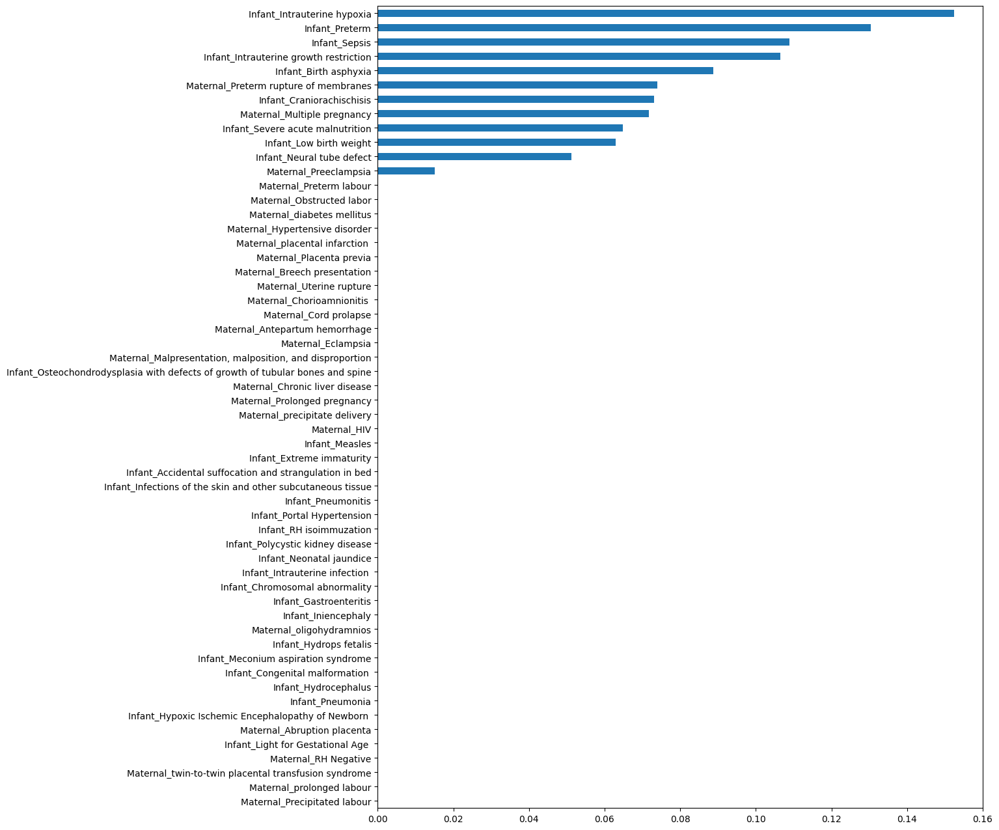

In [97]:
feature_scores = pd.Series(RDSModel.feature_importances_, index=RDSXGB.columns).sort_values(ascending=False)
RDSSorted=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
RDSSorted.plot.barh()

In [99]:
#Heatmap and correlation for RDS
#Feature Engineering
RDSXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Severe acute malnutrition",                                                   
"Infant_Sepsis",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Respiratory distress syndrome"]]



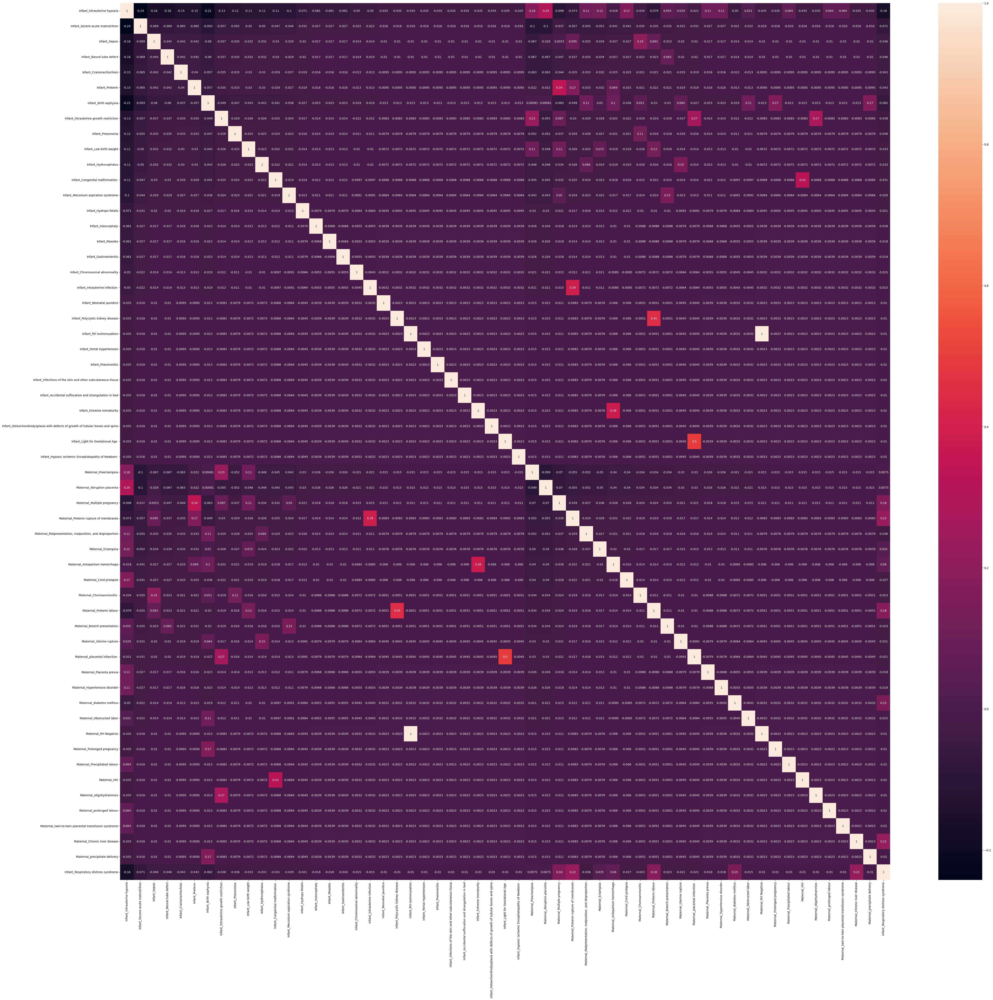

In [100]:
#Respiratory Distress syndrome Correlation and heatmap
plt.figure(figsize=(60,55))
g= sns.heatmap(RDSXGB.corr(),annot=True)

In [148]:
#Sepsis Feature Engineering

SepsisModel=xBoost.fit(SepsisXGB,y)


In [139]:
SepsisModel.score(SepsisXGB,y)

1.0

<AxesSubplot: >

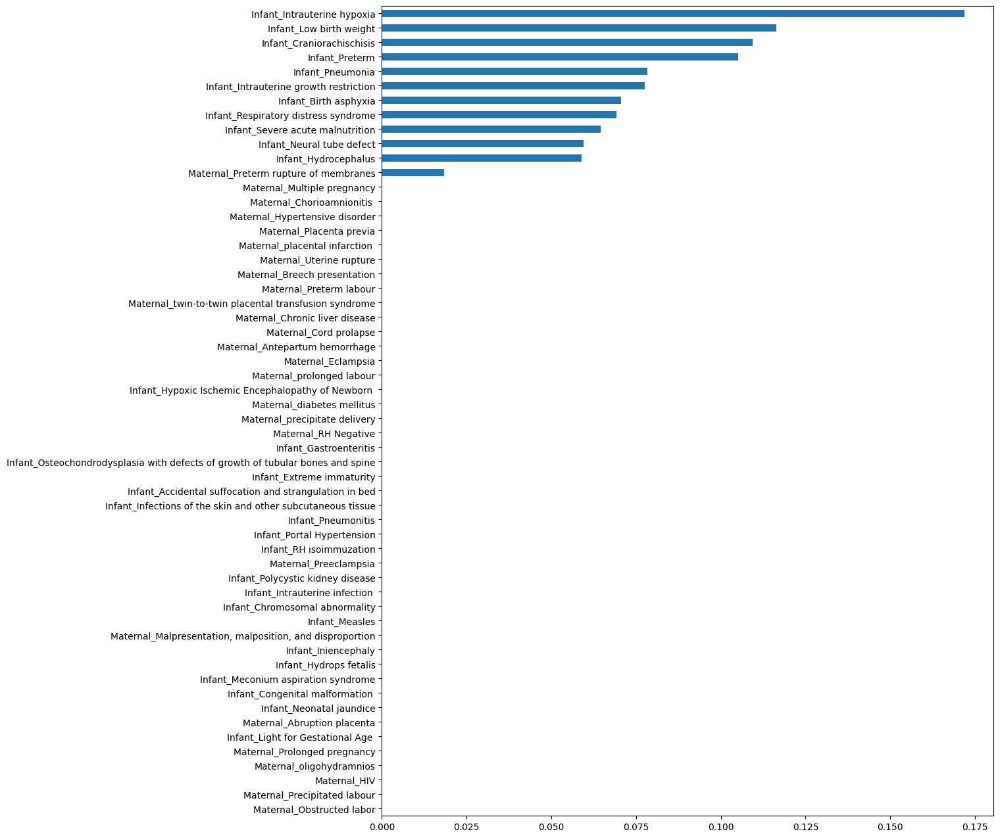

In [149]:
feature_score = pd.Series(SepsisModel.feature_importances_, index=SepsisXGB.columns).sort_values(ascending=False)
SepsisSorted=feature_score.sort_values(ascending=True)
plt.figure(figsize=(12,16))
SepsisSorted.plot.barh()

In [145]:
#Feature Engineering
SepsisXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Severe acute malnutrition",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery"]]

y=data4[['Infant_Sepsis']]

In [134]:
#Feature Engineering
SepsisXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Severe acute malnutrition",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Sepsis"]]


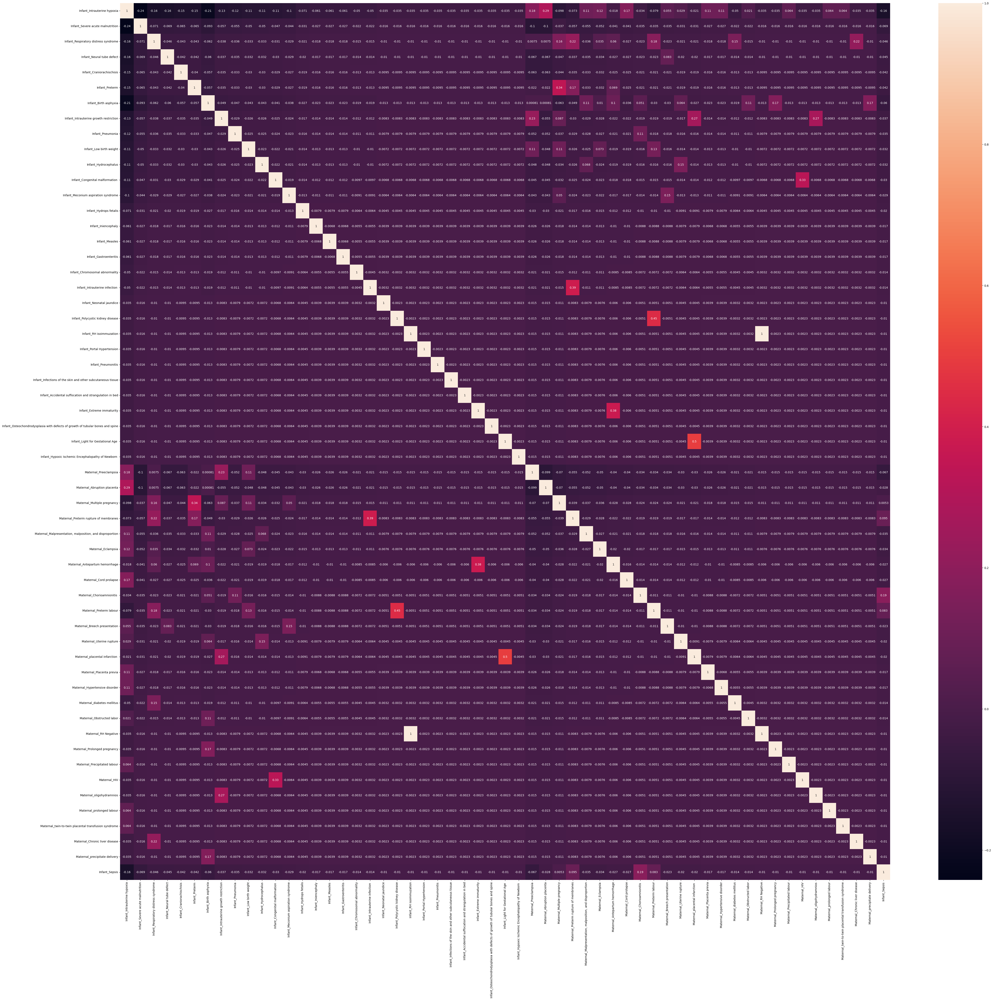

In [107]:
#Sepsis Correlation and heatmap
plt.figure(figsize=(60,55))
g= sns.heatmap(SepsisXGB.corr(),annot=True)

In [144]:
malnuModel=xBoost.fit(malnuXGB,y)


In [119]:
malnuModel.score(malnuXGB,y)

1.0

<AxesSubplot: >

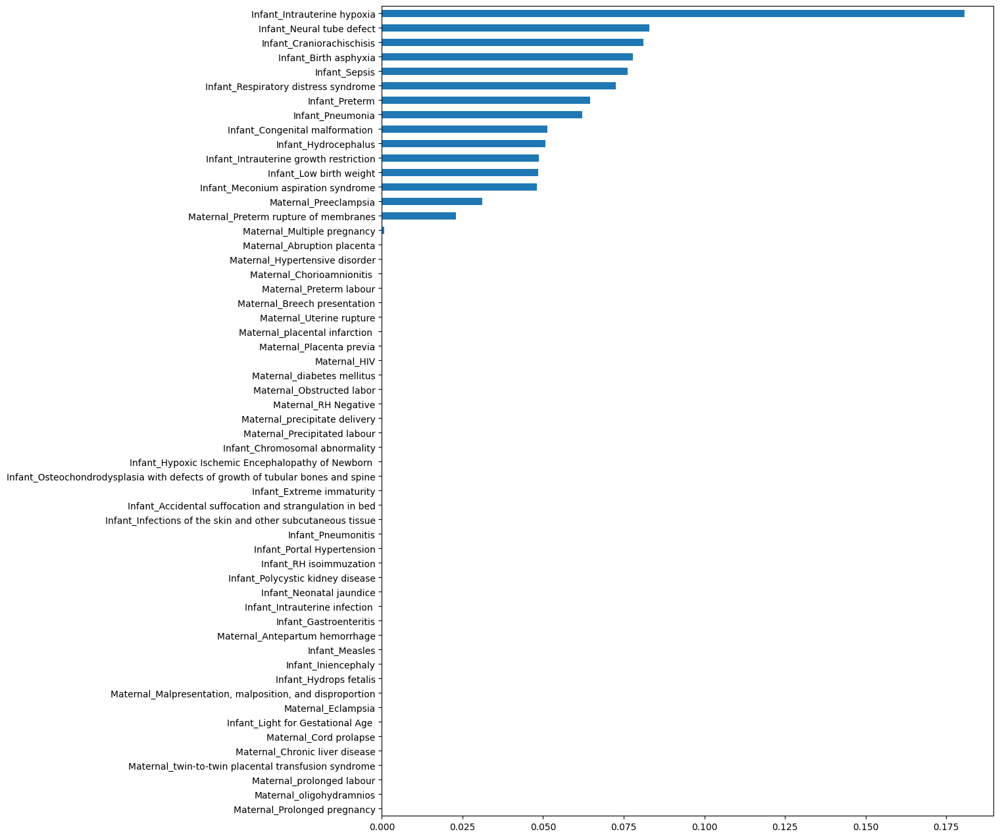

In [112]:
feature_scores = pd.Series(malnuModel.feature_importances_, index=malnuXGB.columns).sort_values(ascending=False)
malnuSorted=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
malnuSorted.plot.barh()

In [109]:
#Feature Engineering
malnuXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Sepsis",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery"]]
y=data4[['Infant_Severe acute malnutrition']]

In [114]:
#Feature Engineering
malnuXGB=data4[["Infant_Intrauterine hypoxia",                                                       
"Infant_Sepsis",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Severe acute malnutrition"]]

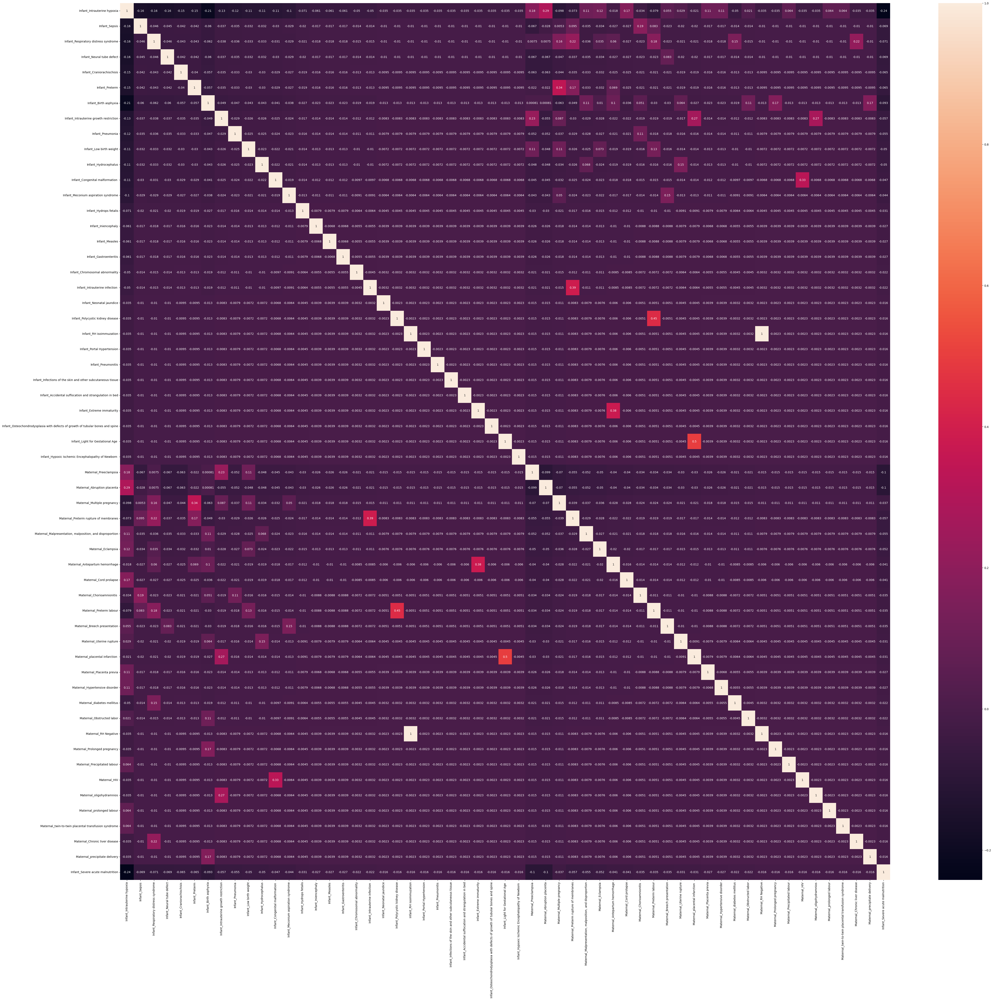

In [115]:
# Severe acute malnutrition Correlation and heatmap
plt.figure(figsize=(60,55))
g= sns.heatmap(malnuXGB.corr(),annot=True)

In [123]:
#Hypoxia Feature Engineering
hypoModel=xBoost.fit(hypoxiaXGB,y)

In [124]:
hypoModel.score(hypoxiaXGB,y)

0.8716216216216216

<AxesSubplot: >

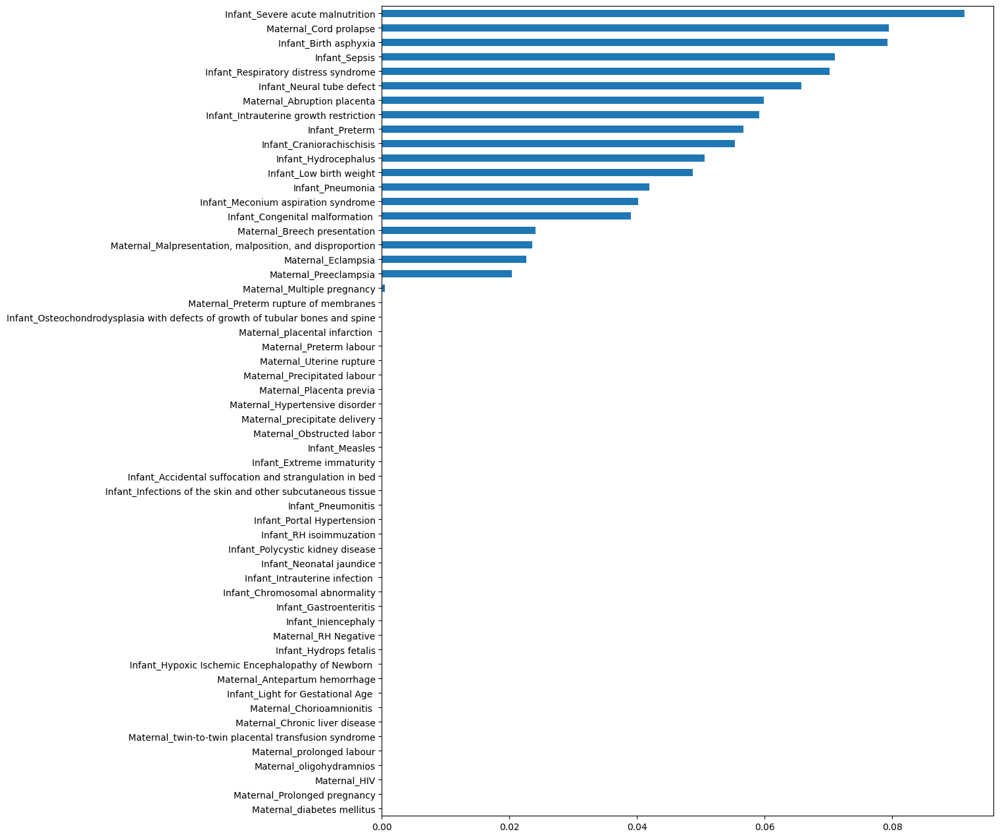

In [125]:
feature_scores = pd.Series(hypoModel.feature_importances_, index=hypoxiaXGB.columns).sort_values(ascending=False)
hypoSorted=feature_scores.sort_values(ascending=True)
plt.figure(figsize=(12,16))
hypoSorted.plot.barh()

In [120]:
#Feature Engineering
hypoxiaXGB=data4[["Infant_Severe acute malnutrition",                                                       
"Infant_Sepsis",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery"]]

y=data4[['Infant_Intrauterine hypoxia']]

In [128]:
#Feature Engineering of Hypoxia
hypoxiaXGB=data4[["Infant_Severe acute malnutrition",                                                       
"Infant_Sepsis",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Intrauterine hypoxia"]]

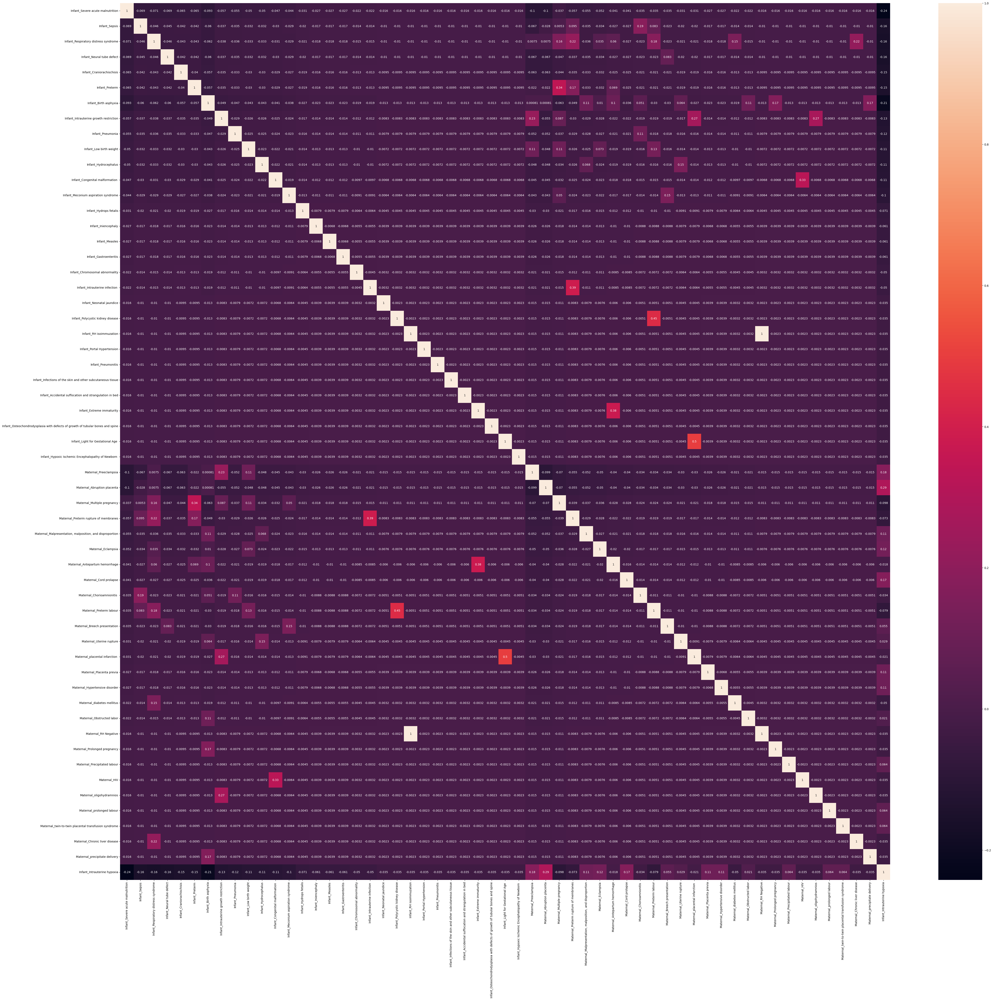

In [129]:
# Corrolation and heatmap of hypoxia
plt.figure(figsize=(60,55))
g= sns.heatmap(hypoxiaXGB.corr(),annot=True)

In [484]:
casualdata['Infant_Intrauterine infection _True'].unique()

array([False,  True])

In [699]:
# Here we begin the Casual analsis of Aphixia for champs dataset
g="""digraph{
"Infant_Intrauterine hypoxia_True";
"Maternal_Multiple pregnancy_True";
"Infant_Severe acute malnutrition_True";
Infant_Sepsis_True;
"Infant_Respiratory distress syndrome_True";
Infant_Craniorachischisis_True;
Infant_Pneumonia_True;
"Infant_Intrauterine growth restriction_True";
"Infant_Meconium aspiration syndrome_True";
"Infant_Neural tube defect_True";
Infant_Preterm_True;
"Infant_Congenital malformation _True";
"Infant_Low birth weight_True";                                                            
Infant_Hydrocephalus_True;
Maternal_Preeclampsia_True;                                     
"Maternal_Abruption placenta_True";
"Maternal_Preterm rupture of membranes_True";
"Maternal_Malpresentation, malposition, and disproportion_True";
Maternal_Eclampsia_True;
"Maternal_Antepartum hemorrhage_True";
"Maternal_Chorioamnionitis_True ";
"Maternal_Cord prolapse_True";
"Maternal_Preterm labour_True";                                    
"Maternal_Breech presentation_True";                             
"Maternal_Uterine rupture_True";
"Maternal_Obstructed labor_True";
"Maternal_Prolonged pregnancy_True";
"Maternal_precipitate delivery_True";
Infant_Preterm_True;
"Infant_Intrauterine infection _True";
Maternal_HIV_True;
"Maternal_Hypertensive disorder_True";
"Maternal_diabetes mellitus_True";
"Maternal_twin-to-twin placental transfusion syndrome_True";
"Infant_Birth asphyxia_True";

Maternal_HIV_True->"Infant_Birth asphyxia_True";
"Maternal_Hypertensive disorder_True"->"Infant_Birth asphyxia_True";
"Maternal_diabetes mellitus_True"->"Infant_Birth asphyxia_True";
"Infant_Intrauterine infection _True"->"Infant_Birth asphyxia_True";
Infant_Preterm_True->"Infant_Birth asphyxia_True";
"Infant_Intrauterine hypoxia_True" ->"Infant_Birth asphyxia_True";
"Maternal_Multiple pregnancy_True" ->"Infant_Birth asphyxia_True";
"Infant_Severe acute malnutrition_True" ->"Infant_Birth asphyxia_True";
Infant_Sepsis_True ->"Infant_Birth asphyxia_True";
"Infant_Congenital malformation _True"->"Infant_Birth asphyxia_True";
"Infant_Respiratory distress syndrome_True" ->"Infant_Birth asphyxia_True";
Infant_Craniorachischisis_True ->"Infant_Birth asphyxia_True";
Infant_Pneumonia_True ->"Infant_Birth asphyxia_True";
"Infant_Intrauterine growth restriction_True" ->"Infant_Birth asphyxia_True";
"Infant_Meconium aspiration syndrome_True" ->"Infant_Birth asphyxia_True";
"Infant_Neural tube defect_True" ->"Infant_Birth asphyxia_True";
Infant_Preterm_True ->"Infant_Birth asphyxia_True";
"Maternal_Prolonged pregnancy_True"->"Infant_Birth asphyxia_True";
"Infant_Low birth weight_True" ->"Infant_Birth asphyxia_True";
Infant_Hydrocephalus_True->"Infant_Birth asphyxia_True";
Maternal_Preeclampsia_True ->"Infant_Birth asphyxia_True";
"Maternal_Abruption placenta_True" ->"Infant_Birth asphyxia_True";
"Maternal_Preterm rupture of membranes_True" ->"Infant_Birth asphyxia_True";
"Maternal_Malpresentation, malposition, and disproportion_True" ->"Infant_Birth asphyxia_True";
Maternal_Eclampsia_True ->"Infant_Birth asphyxia_True";
"Maternal_Antepartum hemorrhage_True" ->"Infant_Birth asphyxia_True";
"Maternal_Chorioamnionitis _True" ->"Infant_Birth asphyxia_True";
"Maternal_Cord prolapse_True" ->"Infant_Birth asphyxia_True";
"Maternal_Preterm labour_True" ->"Infant_Birth asphyxia_True";
"Maternal_Breech presentation_True" ->"Infant_Birth asphyxia_True";
"Maternal_Uterine rupture_True" ->"Infant_Birth asphyxia_True";
"Maternal_Obstructed labor_True" ->"Infant_Birth asphyxia_True";
"Maternal_Maternal_Prolonged pregnancy_True" ->"Infant_Birth asphyxia_True";
"Maternal_precipitate delivery_True" ->"Infant_Birth asphyxia_True";
"Maternal_twin-to-twin placental transfusion syndrome_True"->"Infant_Birth asphyxia_True";
}"""

In [459]:
casualnew=data4.copy()

In [460]:
casualdata=casualnew[["Infant_Severe acute malnutrition",                                                       
"Infant_Sepsis",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Intrauterine hypoxia"]]

In [463]:
casualdata.shape

In [462]:
casualdata=pd.get_dummies(casualdata, columns=["Infant_Severe acute malnutrition",                                                       
"Infant_Sepsis",                                                   
"Infant_Respiratory distress syndrome",                                                                      
"Infant_Neural tube defect",                                                          
"Infant_Craniorachischisis",                                                         
"Infant_Preterm",                                                                     
"Infant_Birth asphyxia",                                               
"Infant_Intrauterine growth restriction",                                             
"Infant_Pneumonia",                                                                   
"Infant_Low birth weight",                                                            
"Infant_Hydrocephalus",                                                               
"Infant_Congenital malformation ",                                                     
"Infant_Meconium aspiration syndrome",                                                                                                  
"Infant_Hydrops fetalis",                                                             
"Infant_Iniencephaly",                                                                
"Infant_Measles",                                                                     
"Infant_Gastroenteritis",                                                             
"Infant_Chromosomal abnormality",                                                     
"Infant_Intrauterine infection ",                                                      
"Infant_Neonatal jaundice",                                                           
"Infant_Polycystic kidney disease",                                                   
"Infant_RH isoimmuzation",                                                           
"Infant_Portal Hypertension",                                                         
"Infant_Pneumonitis",                                                                 
"Infant_Infections of the skin and other subcutaneous tissue",                        
"Infant_Accidental suffocation and strangulation in bed",                             
"Infant_Extreme immaturity",                                                                                                        
"Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine",     
"Infant_Light for Gestational Age ",                                                   
"Infant_Hypoxic Ischemic Encephalopathy of Newborn ",  
"Maternal_Preeclampsia",                                       
"Maternal_Abruption placenta",                                 
"Maternal_Multiple pregnancy",                                 
"Maternal_Preterm rupture of membranes",                     
"Maternal_Malpresentation, malposition, and disproportion",    
"Maternal_Eclampsia",                                         
"Maternal_Antepartum hemorrhage",                              
"Maternal_Cord prolapse",                                      
"Maternal_Chorioamnionitis ",                                   
"Maternal_Preterm labour",                                    
"Maternal_Breech presentation",                                
"Maternal_Uterine rupture",                                    
"Maternal_placental infarction ",                               
"Maternal_Placenta previa",                                    
"Maternal_Hypertensive disorder",                                                                    
"Maternal_diabetes mellitus",                                  
"Maternal_Obstructed labor",                                   
"Maternal_RH Negative",                                        
"Maternal_Prolonged pregnancy",                                
"Maternal_Precipitated labour",                                
"Maternal_HIV",                                                
"Maternal_oligohydramnios",                                    
"Maternal_prolonged labour",                                   
"Maternal_twin-to-twin placental transfusion syndrome",                                                  
"Maternal_Chronic liver disease",                              
"Maternal_precipitate delivery",
"Infant_Intrauterine hypoxia"])

In [470]:
len(casualdata[['Infant_Severe acute malnutrition_False']])

In [458]:
casualnew.shape

In [169]:
#Backup of the original dataset data4 to casual
casual=data4.copy()

In [208]:
import warnings

In [702]:

# We examine casual effect of  Intrauterine hypoxia on  Birth asphyxia
modeltwin=CausalModel(
        data = casualdata,
        treatment="Maternal_twin-to-twin placental transfusion syndrome_True",
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = modeltwin.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modeltwin.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_twin-to-twin placental transfusion syndrome_True  on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modeltwin.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                             d                                                
────────────────────────────────────────────────────────────(E[Infant_Birth as
d[Maternal_twin-to-twin placental transfusion syndrome_True]                  

             
phyxia_True])
             
Estimand assumption 1, Unconfoundedness: If U→{Maternal_twin-to-twin placental transfusion syndrome_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_twin-to-twin placental transfusion syndrome_True,,U) = P(Infant_Birth asphyxia_True|Maternal_twin-to-twin placental transfusion syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_twin-to-twin placental transfusion syndrome_True  on Birth asphyxia is -0.05041638704166873
Refute: Use a Placebo Treatmen

In [692]:
 
# We examine casual effect of  Intrauterine hypoxia on  Birth asphyxia
modelhyp=CausalModel(
        data = casualdata,
        treatment='Maternal_Hypertensive disorder_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = modelhyp.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelhyp.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Hypertensive disorder  on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelhyp.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                  
──────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Hypertensive disorder_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Hypertensive disorder_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Hypertensive disorder_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Hypertensive disorder_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Hypertensive disorder  on Birth asphyxia is -0.050645032787889954
Refute: Use a Placebo Treatment
Estimated effect:-0.050645032787889954
New effect:-17568964577.81405
p value:0.42



In [693]:
 
# We examine casual effect of  Intrauterine hypoxia on  Birth asphyxia
modeldiab=CausalModel(
        data = casualdata,
        treatment='Maternal_diabetes mellitus_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = modeldiab.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modeldiab.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of daibetes  on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modeldiab.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                
──────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_diabetes mellitus_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_diabetes mellitus_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_diabetes mellitus_True,,U) = P(Infant_Birth asphyxia_True|Maternal_diabetes mellitus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of daibetes  on Birth asphyxia is -0.07466063348416042
Refute: Use a Placebo Treatment
Estimated effect:-0.07466063348416042
New effect:119449744340.20502
p value:0.46



In [695]:

 
# We examine casual effect of  Intrauterine hypoxia on  Birth asphyxia
modelHIV=CausalModel(
        data = casualdata,
        treatment='Maternal_HIV_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = modelHIV.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelHIV.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_HIV    on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelHIV.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                         
────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_HIV_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_HIV_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_HIV_True,,U) = P(Infant_Birth asphyxia_True|Maternal_HIV_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_HIV    on Birth asphyxia is -0.03800103715453608
Refute: Use a Placebo Treatment
Estimated effect:-0.03800103715453608
New effect:-113476540773.48793
p value:0.12



In [486]:
# We examine casual effect of  Intrauterine hypoxia on  Birth asphyxia
model=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine hypoxia_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Intrauterine hypoxia on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                
───────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Intrauterine hypoxia_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine hypoxia_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Intrauterine hypoxia_True,,U) = P(Infant_Birth asphyxia_True|Infant_Intrauterine hypoxia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Intrauterine hypoxia on Birth asphyxia is -0.11498257839721282
Refute: Use a Placebo Treatment
Estimated effect:-0.11498257839721282
New effect:-0.0073429750569129456
p value:0.74



In [488]:
# We examine casual effect of  Maternal_Multiple pregnancy on  Birth asphyxia
model1=CausalModel(
        data = casualdata,
        treatment='Maternal_Multiple pregnancy_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of  Maternal_Multiple pregnancy aphixia is " + str(estimate.value))
warnings.filterwarnings("ignore")
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                
───────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Multiple pregnancy_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Multiple pregnancy_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Multiple pregnancy_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Multiple pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of  Maternal_Multiple pregnancy aphixia is -0.07494906253771534
Refute: Use a Placebo Treatment
Estimated effect:-0.07494906253771534
New effect:-212576534.1869141
p value:0.6399999999999999



In [489]:
# We examine casual effect of  Infant_Severe acute malnutrition on  Birth asphyxia
model2=CausalModel(
        data = casualdata,
        treatment='Infant_Severe acute malnutrition_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model2.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Severe acute malnutrition on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model2.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                   d                                                   
────────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Severe acute malnutrition_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Severe acute malnutrition_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Severe acute malnutrition_True,,U) = P(Infant_Birth asphyxia_True|Infant_Severe acute malnutrition_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Severe acute malnutrition on Birth asphyxia is -0.0822942643391517
Refute: Use a Placebo Treatment
Estimated effect:-0.0822942643391517
New effect:0.009694712744334507
p value:0.8799999999999999



In [490]:
# We examine casual effect of  Infant_Sepsis on  Birth asphyxia
model3=CausalModel(
        data = casualdata,
        treatment='Infant_Sepsis_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model3.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Sepsis on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model3.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                         
─────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Sepsis_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Sepsis_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Sepsis_True,,U) = P(Infant_Birth asphyxia_True|Infant_Sepsis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Sepsis on Birth asphyxia is -0.0776470588235293
Refute: Use a Placebo Treatment
Estimated effect:-0.0776470588235293
New effect:0.021248819859903078
p value:0.98



In [491]:
# We examine casual effect of  Infant_Sepsis on  Birth asphyxia
model4=CausalModel(
        data = casualdata,
        treatment='Infant_Respiratory distress syndrome_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model4.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Respiratory distress syndrome on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model4.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                     d                                                     
────────────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Respiratory distress syndrome_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Respiratory distress syndrome_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Respiratory distress syndrome_True,,U) = P(Infant_Birth asphyxia_True|Infant_Respiratory distress syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Respiratory distress syndrome on Birth asphyxia is -0.07783018867924497
Refute: Use a Placebo Treatment
Estimated effect:-0.07783018867924497
New effect:0.011658253093819203
p value:0.98



In [492]:
# We examine casual effect of  Infant_Craniorachischisis on  Birth asphyxia
model5=CausalModel(
        data = casualdata,
        treatment='Infant_Craniorachischisis_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model5.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Craniorachischisis on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model5.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                               
─────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Craniorachischisis_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Craniorachischisis_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Craniorachischisis_True,,U) = P(Infant_Birth asphyxia_True|Infant_Craniorachischisis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Craniorachischisis on Birth asphyxia is -0.07728337236533991
Refute: Use a Placebo Treatment
Estimated effect:-0.07728337236533991
New effect:0.02132031322520924
p value:0.98



In [493]:
# We examine casual effect of  Maternal_Malpresentation, malposition, and disproportion on  Birth asphyxia
model6=CausalModel(
        data = casualdata,
        treatment='Maternal_Malpresentation, malposition, and disproportion_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model6.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model6.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                               d                                              
────────────────────────────────────────────────────────────────(E[Infant_Birt
d[Maternal_Malpresentation, malposition, and disproportion_True]              

                 
h asphyxia_True])
                 
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Malpresentation, malposition, and disproportion_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Malpresentation, malposition, and disproportion_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Malpresentation, malposition, and disproportion_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion on Birth asphyxia is 0.5544294294294327
Refute: Us

In [494]:
# We examine casual effect of  Maternal_Preterm rupture of membranes on  Birth asphyxia
model7=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm rupture of membranes_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm rupture of membranes on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model7.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                                     
─────────────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Preterm rupture of membranes_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm rupture of membranes_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Preterm rupture of membranes_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Preterm rupture of membranes_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm rupture of membranes on Birth asphyxia is -0.06998442758303515
Refute: Use a Placebo Treatment
Estimated effect:-0.06998442758303515
New effect:4791428468.701539
p value:0.9199999999999999



In [495]:
# We examine casual effect of  Maternal_Eclampsia on  Birth asphyxia
model8=CausalModel(
        data = casualdata,
        treatment='Maternal_Eclampsia_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model8.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Eclampsia on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model8.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
            d                                            
──────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Eclampsia_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Eclampsia_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Eclampsia_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Eclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Eclampsia on Birth asphyxia is 0.5049258265193531
Refute: Use a Placebo Treatment
Estimated effect:0.5049258265193531
New effect:8285289192.825575
p value:0.94



In [496]:
# We examine casual effect of  Maternal_Antepartum hemorrhage on  Birth asphyxia
model9=CausalModel(
        data = casualdata,
        treatment='Maternal_Antepartum hemorrhage_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Antepartum hemorrhage on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model9.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                  
──────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Antepartum hemorrhage_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Antepartum hemorrhage_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Antepartum hemorrhage_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Antepartum hemorrhage_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Antepartum hemorrhage on Birth asphyxia is 0.30443716027239925
Refute: Use a Placebo Treatment
Estimated effect:0.30443716027239925
New effect:0.05247720783906671
p value:0.68



In [498]:
# We examine casual effect of  Maternal_Chorioamnionitis on  Birth asphyxia
model10=CausalModel(
        data = casualdata,
        treatment='Maternal_Chorioamnionitis _True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model10.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model10.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Chorioamnionitis on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model10.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                
──────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Chorioamnionitis _True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Chorioamnionitis _True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Chorioamnionitis _True,,U) = P(Infant_Birth asphyxia_True|Maternal_Chorioamnionitis _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Chorioamnionitis on Birth asphyxia is 0.5036836380799964
Refute: Use a Placebo Treatment
Estimated effect:0.5036836380799964
New effect:-7840471898.192534
p value:0.52



In [499]:
# We examine casual effect of  Maternal_Cord prolapse on  Birth asphyxia
model11=CausalModel(
        data = casualdata,
        treatment='Maternal_Cord prolapse_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Cord prolapse on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model11.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                              
──────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Cord prolapse_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Cord prolapse_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Cord prolapse_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Cord prolapse_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Cord prolapse on Birth asphyxia is -0.051108602882058256
Refute: Use a Placebo Treatment
Estimated effect:-0.051108602882058256
New effect:0.03705288883086939
p value:0.64



In [500]:
# We examine casual effect of  Maternal_Preterm labour  on  Birth asphyxia
model12=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm labour_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model12.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model12.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm labour on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model12.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                              
───────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Preterm labour_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm labour_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Preterm labour_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Preterm labour_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm labour on Birth asphyxia is -0.07517084282460498
Refute: Use a Placebo Treatment
Estimated effect:-0.07517084282460498
New effect:-10485836555.101147
p value:0.48



In [501]:
# We examine casual effect of  Maternal_Breech presentation  on  Birth asphyxia
model13=CausalModel(
        data = casualdata,
        treatment='Maternal_Breech presentation_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model13.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model13.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Breech presentation on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model13.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                 
────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Breech presentation_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Breech presentation_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Breech presentation_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Breech presentation_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Breech presentation on Birth asphyxia is -0.06416610232100009
Refute: Use a Placebo Treatment
Estimated effect:-0.06416610232100009
New effect:0.058297656248682064
p value:0.58



In [502]:
# We examine casual effect of  Maternal_Uterine rupture  on  Birth asphyxia
model14=CausalModel(
        data = casualdata,
        treatment='Maternal_Uterine rupture_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model14.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Uterine rupture on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model14.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                               
────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Uterine rupture_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Uterine rupture_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Uterine rupture_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Uterine rupture_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Uterine rupture on Birth asphyxia is 0.551146601146589
Refute: Use a Placebo Treatment
Estimated effect:0.551146601146589
New effect:0.03985592674548242
p value:0.5



In [503]:
# We examine casual effect of  Maternal_Obstructed labor  on  Birth asphyxia
model15=CausalModel(
        data = casualdata,
        treatment='Maternal_Obstructed labor_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model15.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model15.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Obstructed labor on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model15.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                               
─────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Obstructed labor_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Obstructed labor_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Obstructed labor_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Obstructed labor_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Obstructed labor on Birth asphyxia is 0.5739982063511326
Refute: Use a Placebo Treatment
Estimated effect:0.5739982063511326
New effect:147523489343.8511
p value:0.42



In [504]:
# We examine casual effect of  MMaternal_Prolonged pregnancy  on  Birth asphyxia
model17=CausalModel(
        data = casualdata,
        treatment='Maternal_Prolonged pregnancy_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model17.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Prolonged pregnancy labor on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model17.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                 
────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Prolonged pregnancy_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Prolonged pregnancy_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Prolonged pregnancy_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Prolonged pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Prolonged pregnancy labor on Birth asphyxia is 0.9277652370203394
Refute: Use a Placebo Treatment
Estimated effect:0.9277652370203394
New effect:-158873916778.79446
p value:0.18



In [505]:
# We examine casual effect of  Maternal_precipitate delivery  on  Birth asphyxia
model18=CausalModel(
        data = casualdata,
        treatment='Maternal_precipitate delivery_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model18.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model18.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_precipitate delivery labor on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model18.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                 
─────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_precipitate delivery_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_precipitate delivery_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_precipitate delivery_True,,U) = P(Infant_Birth asphyxia_True|Maternal_precipitate delivery_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_precipitate delivery labor on Birth asphyxia is 0.9277652370203191
Refute: Use a Placebo Treatment
Estimated effect:0.9277652370203191
New effect:-118003173695.40472
p value:0.14



In [506]:

# We examine casual effect of  Maternal_Abruption placenta  on  Birth asphyxia
model19=CausalModel(
        data = casualdata,
        treatment='Maternal_Abruption placenta_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model19.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model19.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Abruption placenta on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model19.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                
───────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Abruption placenta_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Abruption placenta_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Abruption placenta_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Abruption placenta_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Abruption placenta on Birth asphyxia is 0.3159452769601282
Refute: Use a Placebo Treatment
Estimated effect:0.3159452769601282
New effect:0.019613698887415654
p value:0.74



In [507]:

# We examine casual effect of  Maternal_Preeclampsia  on  Birth asphyxia
model20=CausalModel(
        data = casualdata,
        treatment='Maternal_Preeclampsia_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model20.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preeclampsia on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                             
─────────────────────────────(E[Infant_Birth asphyxia_True])
d[Maternal_Preeclampsia_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Maternal_Preeclampsia_True,,U) = P(Infant_Birth asphyxia_True|Maternal_Preeclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preeclampsia on Birth asphyxia is 0.43700383551868427
Refute: Use a Placebo Treatment
Estimated effect:0.43700383551868427
New effect:0.029727496537938297
p value:0.5800000000000001



In [508]:

# We examine casual effect of  Infant_Hydrocephalus  on  Birth asphyxia
model21=CausalModel(
        data = casualdata,
        treatment='Infant_Hydrocephalus_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model21.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model21.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Hydrocephalus on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model21.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                             
────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Hydrocephalus_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Hydrocephalus_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Hydrocephalus_True,,U) = P(Infant_Birth asphyxia_True|Infant_Hydrocephalus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Hydrocephalus on Birth asphyxia is -0.07603686635944736
Refute: Use a Placebo Treatment
Estimated effect:-0.07603686635944736
New effect:0.05874126569121902
p value:0.98



In [509]:

# We examine casual effect of  Infant_Low birth weight  on  Birth asphyxia
model22=CausalModel(
        data = casualdata,
        treatment='Infant_Low birth weight_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model22.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model22.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Low birth weight on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model22.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                              
───────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Low birth weight_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Low birth weight_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Low birth weight_True,,U) = P(Infant_Birth asphyxia_True|Infant_Low birth weight_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Low birth weight on Birth asphyxia is -0.07603686635944805
Refute: Use a Placebo Treatment
Estimated effect:-0.07603686635944805
New effect:-825994254.5328722
p value:0.82



In [510]:

# We examine casual effect of  Infant_Congenital malformation  on  Birth asphyxia
model23=CausalModel(
        data = casualdata,
        treatment='Infant_Congenital malformation _True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model23.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model23.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Congenital malformation on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model23.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                   d                                                  
───────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Congenital malformation _True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Congenital malformation _True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Congenital malformation _True,,U) = P(Infant_Birth asphyxia_True|Infant_Congenital malformation _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Congenital malformation on Birth asphyxia is -0.07586206896551694
Refute: Use a Placebo Treatment
Estimated effect:-0.07586206896551694
New effect:0.021084111524747633
p value:0.74



In [511]:

# We examine casual effect of infant preterm    on  Birth asphyxia
model24=CausalModel(
        data = casualdata,
        treatment='Infant_Neural tube defect_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model24.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model24.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Neural tube defect on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model24.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                               
─────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Neural tube defect_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Neural tube defect_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Neural tube defect_True,,U) = P(Infant_Birth asphyxia_True|Infant_Neural tube defect_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Neural tube defect on Birth asphyxia is -0.07764705882352939
Refute: Use a Placebo Treatment
Estimated effect:-0.07764705882352939
New effect:0.02944731581614812
p value:0.8200000000000001



In [512]:

# We examine casual effect of Infant_Pneumonia   on  Birth asphyxia
model25=CausalModel(
        data = casualdata,
        treatment='Infant_Pneumonia_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model25.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model25.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Pneumonia on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model25.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                           
────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Pneumonia_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Pneumonia_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Pneumonia_True,,U) = P(Infant_Birth asphyxia_True|Infant_Pneumonia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Pneumonia on Birth asphyxia is -0.0763888888888891
Refute: Use a Placebo Treatment
Estimated effect:-0.0763888888888891
New effect:0.007069834824414445
p value:0.8



In [514]:

# We examine casual effect of Infant_Intrauterine growth restriction   on  Birth asphyxia
model26=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine growth restriction_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model26.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model26.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine growth restriction is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model26.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                                      
──────────────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Intrauterine growth restriction_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine growth restriction_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Intrauterine growth restriction_True,,U) = P(Infant_Birth asphyxia_True|Infant_Intrauterine growth restriction_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine growth restriction is -0.07656612529002162
Refute: Use a Placebo Treatment
Estimated effect:-0.07656612529002162
New effect:0.044178998805438796
p value:0.98



In [515]:

# We examine casual effect of Infant_Meconium aspiration syndrome   on  Birth asphyxia
model26=CausalModel(
        data = casualdata,
        treatment='Infant_Meconium aspiration syndrome_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model26.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model26.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Meconium aspiration syndrome on Birth asphyxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model26.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                     d                                                    
───────────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Meconium aspiration syndrome_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Meconium aspiration syndrome_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Meconium aspiration syndrome_True,,U) = P(Infant_Birth asphyxia_True|Infant_Meconium aspiration syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Meconium aspiration syndrome on Birth asphyxia is -0.07568807339449538
Refute: Use a Placebo Treatment
Estimated effect:-0.07568807339449538
New effect:0.01820320472781002
p value:0.7



In [516]:
# We examine casual effect of Infant_Intrauterine growth restriction   on  Birth asphyxia
model27=CausalModel(
        data = casualdata,
        treatment='Infant_Preterm_True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model27.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model27.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Preterm on asphixia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model27.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                          
──────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Preterm_True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Preterm_True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Preterm_True,,U) = P(Infant_Birth asphyxia_True|Infant_Preterm_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Preterm on asphixia is -0.07728337236534018
Refute: Use a Placebo Treatment
Estimated effect:-0.07728337236534018
New effect:627844872.9152163
p value:0.98



In [517]:
# 
# We examine casual effect of Infant_Intrauterine growth restriction   on  Birth asphyxia
model28=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine infection _True',
        outcome='Infant_Birth asphyxia_True',
        graph=g)


# Identification
identified_estimand = model28.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model28.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  ofInfant_Intrauterine infection on asphixia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model28.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                  
──────────────────────────────────────(E[Infant_Birth asphyxia_True])
d[Infant_Intrauterine infection _True]                               
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine infection _True} and U→Infant_Birth asphyxia_True then P(Infant_Birth asphyxia_True|Infant_Intrauterine infection _True,,U) = P(Infant_Birth asphyxia_True|Infant_Intrauterine infection _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  ofInfant_Intrauterine infection on asphixia is -0.038423321511556856
Refute: Use a Placebo Treatment
Estimated effect:-0.038423321511556856
New effect:175756145723.6156
p value:0.5



In [ ]:

#Aphixia top factors from feauture engineering
Infant_Intrauterine hypoxia
Maternal_Multiple pregnancy
Infant_Severe acute malnutrition
Infant_Sepsis
Infant_Respiratory distress syndrome
Infant_Craniorachischisis
Infant_Pneumonia
Infant_Intrauterine growth restriction
Infant_Meconium aspiration syndrome
Infant_Neural tube defect
Infant_Preterm
Infant_Congenital malformation 
Infant_Low birth weight                                                            
Infant_Hydrocephalus 
Maternal_Preeclampsia                                      
Maternal_Abruption placenta

#Correlation
Maternal_Preterm rupture of membranes
Maternal_Malpresentation, malposition, and disproportion
Maternal_Eclampsia
Maternal_Antepartum hemorrhage
Maternal_Chorioamnionitis
Maternal_Cord prolapse
Maternal_Preterm labour                                    
Maternal_Breech presentation                              
Maternal_Uterine rupture
Maternal_Obstructed labor
Maternal_Prolonged pregnancy
Maternal_precipitate delivery

In [684]:
#Here we begin to develop the digraph for the RDS casual analysis
g1="""digraph{
"Infant_Intrauterine hypoxia_True";
Infant_Preterm_True;
Infant_Sepsis_True;
"Infant_Intrauterine growth restriction_True";
"Infant_Birth asphyxia_True";
"Maternal_Preterm rupture of membranes_True";
Infant_Craniorachischisis_True;
"Maternal_Prolonged pregnancy_True";
"Infant_Low birth weight_True"; 
"Infant_Severe acute malnutrition_True";
"Maternal_Preterm labour_True";
Maternal_Preeclampsia_True; 
"Infant_Neural tube defect_True";
Infant_Pneumonia_True;
Infant_Hydrocephalus_True;
Maternal_Eclampsia_True;
"Maternal_Multiple pregnancy_True";
"Maternal_Malpresentation, malposition, and disproportion_True";
"Maternal_Antepartum hemorrhage_True";
"Maternal_diabetes mellitus_True";
"Maternal_Chronic liver disease_True";
"Infant_Intrauterine infection _True"; 
 Maternal_HIV_True;
"Maternal_Obstructed labor_True";
"Maternal_Hypertensive disorder_True";
"Maternal_Cord prolapse_True";
"Maternal_Abruption placenta_True";
"Infant_Meconium aspiration syndrome_True";
"Infant_Respiratory distress syndrome_True";
"Maternal_Chorioamnionitis _True";

"Maternal_Chorioamnionitis _True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Cord prolapse_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Abruption placenta_True"->"Infant_Respiratory distress syndrome_True";
Maternal_HIV_True->"Infant_Respiratory distress syndrome_True";
"Maternal_Obstructed labor_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Hypertensive disorder_True"->"Infant_Respiratory distress syndrome_True";
"Infant_Intrauterine infection _True"->"Infant_Respiratory distress syndrome_True";
"Infant_Intrauterine hypoxia_True"->"Infant_Respiratory distress syndrome_True";
Infant_Preterm_True->"Infant_Respiratory distress syndrome_True";
Infant_Sepsis_True->"Infant_Respiratory distress syndrome_True";
"Infant_Intrauterine growth restriction_True"->"Infant_Respiratory distress syndrome_True";
"Infant_Birth asphyxia_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Preterm rupture of membranes_True"->"Infant_Respiratory distress syndrome_True";
Infant_Craniorachischisis_True->"Infant_Respiratory distress syndrome_True";
"Maternal_Prolonged pregnancy_True"->"Infant_Respiratory distress syndrome_True";
"Infant_Low birth weight_True"->"Infant_Respiratory distress syndrome_True";
"Infant_Severe acute malnutrition_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Preterm labour_True"->"Infant_Respiratory distress syndrome_True";
Maternal_Preeclampsia_True->"Infant_Respiratory distress syndrome_True";
"Infant_Neural tube defect_True"->"Infant_Respiratory distress syndrome_True";
Infant_Pneumonia_True->"Infant_Respiratory distress syndrome_True";
Infant_Hydrocephalus_True->"Infant_Respiratory distress syndrome_True";
Maternal_Eclampsia_True->"Infant_Respiratory distress syndrome_True";
"Maternal_Malpresentation, malposition, and disproportion_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Antepartum hemorrhage_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_diabetes mellitus_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Chronic liver disease_True"->"Infant_Respiratory distress syndrome_True";
"Maternal_Multiple pregnancy_True"->"Infant_Respiratory distress syndrome_True";
"Infant_Meconium aspiration syndrome_True"->"Infant_Respiratory distress syndrome_True";
}"""

In [685]:

# We examine casual effect of Infant_Pneumonia   on  RDS
modelcro=CausalModel(
        data = casualdata,
        treatment='Maternal_Chorioamnionitis _True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modelcro.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelcro.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Chorioamnionitis syndrome on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelcro.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                             
──────────────────────────────────(E[Infant_Respiratory distress syndrome_True
d[Maternal_Chorioamnionitis _True]                                            

  
])
  
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Chorioamnionitis _True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Chorioamnionitis _True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Chorioamnionitis _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Chorioamnionitis syndrome on RDS is -0.04098175624371536
Refute: Use a Placebo Treatment
Estimated effect:-0.04098175624371536
New effect:-5375319740.636423
p value:0.34



In [668]:

# We examine casual effect of Infant_Pneumonia   on  RDS
modelpre=CausalModel(
        data = casualdata,
        treatment='Maternal_Preeclampsia_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modelpre.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelpre.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preeclampsia_True syndrome on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelpre.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                            
─────────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Maternal_Preeclampsia_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Preeclampsia_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Preeclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preeclampsia_True syndrome on RDS is 0.43742752653643574
Refute: Use a Placebo Treatment
Estimated effect:0.43742752653643574
New effect:0.002153287987862472
p value:0.88



In [667]:



# We examine casual effect of Infant_Pneumonia   on  RDS
modelmco=CausalModel(
        data = casualdata,
        treatment='Infant_Meconium aspiration syndrome_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modelmco.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelmco.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Meconium aspiration syndrome on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelmco.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                     d                                                        
───────────────────────────────────────────(E[Infant_Respiratory distress synd
d[Infant_Meconium aspiration syndrome_True]                                   

           
rome_True])
           
Estimand assumption 1, Unconfoundedness: If U→{Infant_Meconium aspiration syndrome_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Meconium aspiration syndrome_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Meconium aspiration syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Meconium aspiration syndrome on RDS is -0.0458715596330275
Refute: Use a Placebo Treatment
Estimated effect:-0.0458715596330275
New effe

In [664]:


# We examine casual effect of Infant_Pneumonia   on  RDS
modellapl=CausalModel(
        data = casualdata,
        treatment='Maternal_Abruption placenta_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modellapl.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modellapl.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Abruption placenta_True on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modellapl.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                            
───────────────────────────────────(E[Infant_Respiratory distress syndrome_Tru
d[Maternal_Abruption placenta_True]                                           

   
e])
   
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Abruption placenta_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Abruption placenta_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Abruption placenta_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Abruption placenta_True on RDS is 0.2827728718817826
Refute: Use a Placebo Treatment
Estimated effect:0.2827728718817826
New effect:-0.004957355512123901
p value:0.78



In [663]:


# We examine casual effect of Infant_Pneumonia   on  RDS
modellap=CausalModel(
        data = casualdata,
        treatment='Maternal_Cord prolapse_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modellap.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modellap.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Cord prolapse on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modellap.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                             
──────────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Maternal_Cord prolapse_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Cord prolapse_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Cord prolapse_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Cord prolapse_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Cord prolapse on RDS is -0.030974910837611044
Refute: Use a Placebo Treatment
Estimated effect:-0.030974910837611044
New effect:-0.004835495984246678
p value:0.4



In [653]:


# We examine casual effect of Infant_Pneumonia   on  RDS
modelhyp=CausalModel(
        data = casualdata,
        treatment='Maternal_Hypertensive disorder_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modelhyp.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelhyp.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Hypertensive disorder on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelhyp.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                           
──────────────────────────────────────(E[Infant_Respiratory distress syndrome_
d[Maternal_Hypertensive disorder_True]                                        

      
True])
      
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Hypertensive disorder_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Hypertensive disorder_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Hypertensive disorder_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Hypertensive disorder on RDS is -0.03069395926538784
Refute: Use a Placebo Treatment
Estimated effect:-0.03069395926538784
New effect:-0.0016393481019331985
p value:0.2



In [649]:

# We examine casual effect of Infant_Pneumonia   on  RDS
modelobs=CausalModel(
        data = casualdata,
        treatment='Maternal_Obstructed labor_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modelobs.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelobs.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of obstructed labour on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelobs.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                             
─────────────────────────────────(E[Infant_Respiratory distress syndrome_True]
d[Maternal_Obstructed labor_True]                                             

 
)
 
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Obstructed labor_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Obstructed labor_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Obstructed labor_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of obstructed labour on RDS is -0.036620330737977574
Refute: Use a Placebo Treatment
Estimated effect:-0.036620330737977574
New effect:62146209246.62661
p value:0.36



In [651]:

# We examine casual effect of Infant_Pneumonia   on  RDS
modelhv=CausalModel(
        data = casualdata,
        treatment='Maternal_HIV_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = modelhv.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelhv.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of mothers  HIV status on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelhv.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                                        
────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Maternal_HIV_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Maternal_HIV_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_HIV_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_HIV_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of mothers  HIV status on RDS is -0.045146726862303345
Refute: Use a Placebo Treatment
Estimated effect:-0.045146726862303345
New effect:-105975751585.90973
p value:0.1



In [519]:

# We examine casual effect of Infant_Pneumonia   on  RDS
model=CausalModel(
        data = casualdata,
        treatment='Infant_Pneumonia_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Pneumonia on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                                          
────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Infant_Pneumonia_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Pneumonia_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Pneumonia_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Pneumonia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Pneumonia on RDS is -0.04629629629629641
Refute: Use a Placebo Treatment
Estimated effect:-0.04629629629629641
New effect:0.0029513397749373472
p value:0.6



In [520]:

# We examine casual effect of Maternal_Multiple pregnancy   on  RDS
model1=CausalModel(
        data = casualdata,
        treatment='Maternal_Multiple pregnancy_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Multiple pregnancy on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                            
───────────────────────────────────(E[Infant_Respiratory distress syndrome_Tru
d[Maternal_Multiple pregnancy_True]                                           

   
e])
   
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Multiple pregnancy_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Multiple pregnancy_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Multiple pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Multiple pregnancy on RDS is 0.29550827423168347
Refute: Use a Placebo Treatment
Estimated effect:0.29550827423168347
New effect:0.01751269874880287
p value:0.98



In [523]:

# We examine casual effect of Maternal_Preterm rupture of membranes   on  RDS
model2=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm rupture of membranes_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model2.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm rupture of membranes on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model2.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                                       
─────────────────────────────────────────────(E[Infant_Respiratory distress sy
d[Maternal_Preterm rupture of membranes_True]                                 

             
ndrome_True])
             
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm rupture of membranes_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Preterm rupture of membranes_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Preterm rupture of membranes_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm rupture of membranes on RDS is 0.5236878409732174
Refute: Use a Placebo Treatment
Estimated effect:0.5236878409732

In [524]:

# We examine casual effect of Maternal_Eclampsia   on  RDS
model3=CausalModel(
        data = casualdata,
        treatment='Maternal_Eclampsia_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model3.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Eclampsia on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model3.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
            d                                                           
──────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Maternal_Eclampsia_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Eclampsia_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Eclampsia_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Eclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Eclampsia on RDS is 0.5056696419282949
Refute: Use a Placebo Treatment
Estimated effect:0.5056696419282949
New effect:0.0016488232268949278
p value:0.52



In [525]:

# We examine casual effect of Maternal_Antepartum hemorrhage  on  RDS
model4=CausalModel(
        data = casualdata,
        treatment='Maternal_Antepartum hemorrhage_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model4.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Antepartum hemorrhage on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model4.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                           
──────────────────────────────────────(E[Infant_Respiratory distress syndrome_
d[Maternal_Antepartum hemorrhage_True]                                        

      
True])
      
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Antepartum hemorrhage_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Antepartum hemorrhage_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Antepartum hemorrhage_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Antepartum hemorrhage on RDS is 0.2234136310223253
Refute: Use a Placebo Treatment
Estimated effect:0.2234136310223253
New effect:-0.010581667585958203
p value:0.34

In [526]:

# We examine casual effect of Maternal_Antepartum hemorrhage  on  RDS
model5=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm labour_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model5.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm labouron RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model5.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                             
───────────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Maternal_Preterm labour_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm labour_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Preterm labour_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Preterm labour_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm labouron RDS is 0.5821208452188069
Refute: Use a Placebo Treatment
Estimated effect:0.5821208452188069
New effect:-6294018975.572563
p value:0.22



In [527]:

# We examine casual effect of Maternal_Antepartum hemorrhage  on  RDS
model6=CausalModel(
        data = casualdata,
        treatment='Maternal_diabetes mellitus_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model6.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_diabetes mellitus RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model6.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                             
──────────────────────────────────(E[Infant_Respiratory distress syndrome_True
d[Maternal_diabetes mellitus_True]                                            

  
])
  
Estimand assumption 1, Unconfoundedness: If U→{Maternal_diabetes mellitus_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_diabetes mellitus_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_diabetes mellitus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_diabetes mellitus RDS is 0.4570135746606246
Refute: Use a Placebo Treatment
Estimated effect:0.4570135746606246
New effect:77013764412.17023
p value:0.28



In [661]:
# We examine casual effect of Maternal_Antepartum hemorrhage  on  RDS
model7=CausalModel(
        data = casualdata,
        treatment='Maternal_Chronic liver disease_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Chronic liver disease RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model7.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                           
──────────────────────────────────────(E[Infant_Respiratory distress syndrome_
d[Maternal_Chronic liver disease_True]                                        

      
True])
      
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Chronic liver disease_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Chronic liver disease_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Chronic liver disease_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Chronic liver disease RDS is 0.9571106094808215
Refute: Use a Placebo Treatment
Estimated effect:0.9571106094808215
New effect:-52857569207.19835
p value:0.12



In [660]:

# We examine casual effect of Maternal_Malpresentation, malposition, and disproportion  on  RDS
model8=CausalModel(
        data = casualdata,
        treatment='Maternal_Malpresentation, malposition, and disproportion_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model8.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model8.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                               d                                              
────────────────────────────────────────────────────────────────(E[Infant_Resp
d[Maternal_Malpresentation, malposition, and disproportion_True]              

                                
iratory distress syndrome_True])
                                
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Malpresentation, malposition, and disproportion_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Malpresentation, malposition, and disproportion_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Malpresentation, malposition, and disproportion_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Malprese

In [659]:

# We examine casual effect of Infant_Hydrocephalus  on  RDS
model9=CausalModel(
        data = casualdata,
        treatment='Infant_Hydrocephalus_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Hydrocephalus RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model9.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                                            
────────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Infant_Hydrocephalus_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Hydrocephalus_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Hydrocephalus_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Hydrocephalus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Hydrocephalus RDS is -0.04608294930875596
Refute: Use a Placebo Treatment
Estimated effect:-0.04608294930875596
New effect:-624219499.6399834
p value:0.52



In [531]:


# We examine casual effect of Maternal_Malpresentation, malposition, and disproportion  on  RDS
model9=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine hypoxia_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine hypoxia on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model9.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                            
───────────────────────────────────(E[Infant_Respiratory distress syndrome_Tru
d[Infant_Intrauterine hypoxia_True]                                           

   
e])
   
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine hypoxia_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Intrauterine hypoxia_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Intrauterine hypoxia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine hypoxia on RDS is -0.06968641114982543
Refute: Use a Placebo Treatment
Estimated effect:-0.06968641114982543
New effect:-0.00811029434482319
p value:0.58



In [532]:

# We examine casual effect of Infant_Preterm  on  RDS
model10=CausalModel(
        data = casualdata,
        treatment='Infant_Preterm_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model10.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model10.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Preterm on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model10.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                                         
──────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Infant_Preterm_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Preterm_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Preterm_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Preterm_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Preterm on RDS is -0.04683840749414557
Refute: Use a Placebo Treatment
Estimated effect:-0.04683840749414557
New effect:-0.017201226518641567
p value:0.52



In [533]:

# We examine casual effect of Infant_Intrauterine growth restriction on  RDS
model11=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine growth restriction_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine growth restriction on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model11.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                                       
──────────────────────────────────────────────(E[Infant_Respiratory distress s
d[Infant_Intrauterine growth restriction_True]                                

              
yndrome_True])
              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine growth restriction_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Intrauterine growth restriction_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Intrauterine growth restriction_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine growth restriction on RDS is -0.04640371229698275
Refute: Use a Placebo Treatment
Estimated effect:-0.046

In [658]:

# We examine casual effect of Infant_Birth asphyxia growth restriction on  RDS
model12=CausalModel(
        data = casualdata,
        treatment='Infant_Birth asphyxia_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model12.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model12.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Birth asphyxia on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model12.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                            
─────────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Infant_Birth asphyxia_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Birth asphyxia_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Birth asphyxia_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Birth asphyxia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Birth asphyxia on RDS is -0.04866180048661799
Refute: Use a Placebo Treatment
Estimated effect:-0.04866180048661799
New effect:-0.008728856358493848
p value:0.72



In [657]:

# We examine casual effect of IInfant_Sepsis growth restriction on  RDS
model13=CausalModel(
        data = casualdata,
        treatment='Infant_Sepsis_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model13.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model13.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Sepsis on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model13.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                                        
─────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Infant_Sepsis_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Sepsis_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Sepsis_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Sepsis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Sepsis on RDS is -0.04705882352941173
Refute: Use a Placebo Treatment
Estimated effect:-0.04705882352941173
New effect:-0.012212205977283466
p value:0.64



In [537]:

# We examine casual effect of Infant_Craniorachischisis  on  RDS
model14=CausalModel(
        data = casualdata,
        treatment='Infant_Craniorachischisis_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model14.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Craniorachischisis on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model14.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                             
─────────────────────────────────(E[Infant_Respiratory distress syndrome_True]
d[Infant_Craniorachischisis_True]                                             

 
)
 
Estimand assumption 1, Unconfoundedness: If U→{Infant_Craniorachischisis_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Craniorachischisis_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Craniorachischisis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Craniorachischisis on RDS is -0.04683840749414539
Refute: Use a Placebo Treatment
Estimated effect:-0.04683840749414539
New effect:-120742177.15346001
p value:0.52



In [538]:
  

# We examine casual effect of Infant_Craniorachischisis  on  RDS
model14a=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine infection _True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model14a.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14a.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine infection on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model14a.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                           
──────────────────────────────────────(E[Infant_Respiratory distress syndrome_
d[Infant_Intrauterine infection _True]                                        

      
True])
      
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine infection _True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Intrauterine infection _True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Intrauterine infection _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine infection on RDS is -0.023286861522155665
Refute: Use a Placebo Treatment
Estimated effect:-0.023286861522155665
New effect:61776723209.60439
p value:0.2

In [656]:

# We examine casual effect of Maternal_Prolonged pregnancy  on  RDS
model15=CausalModel(
        data = casualdata,
        treatment='Maternal_Prolonged pregnancy_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model15.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model15.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Prolonged pregnancy on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model15.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                            
────────────────────────────────────(E[Infant_Respiratory distress syndrome_Tr
d[Maternal_Prolonged pregnancy_True]                                          

    
ue])
    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Prolonged pregnancy_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Maternal_Prolonged pregnancy_True,,U) = P(Infant_Respiratory distress syndrome_True|Maternal_Prolonged pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Prolonged pregnancy on RDS is -0.024251113415898622
Refute: Use a Placebo Treatment
Estimated effect:-0.024251113415898622
New effect:-50011547454.78633
p value:0.08



In [655]:

# We examine casual effect of Infant_Low birth weight  on  RDS
model16=CausalModel(
        data = casualdata,
        treatment='Infant_Low birth weight_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model16.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model16.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Low birth weight on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model16.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                             
───────────────────────────────(E[Infant_Respiratory distress syndrome_True])
d[Infant_Low birth weight_True]                                              
Estimand assumption 1, Unconfoundedness: If U→{Infant_Low birth weight_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Low birth weight_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Low birth weight_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Low birth weight on RDS is -0.0460829493087564
Refute: Use a Placebo Treatment
Estimated effect:-0.0460829493087564
New effect:0.007292684303544399
p value:0.68



In [654]:

# We examine casual effect of Infant_Severe acute malnutrition  on  RDS
model17=CausalModel(
        data = casualdata,
        treatment='Infant_Severe acute malnutrition_True',
        outcome='Infant_Respiratory distress syndrome_True',
        graph=g1)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model17.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Severe acute malnutrition on RDS is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model17.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                   d                                                          
────────────────────────────────────────(E[Infant_Respiratory distress syndrom
d[Infant_Severe acute malnutrition_True]                                      

        
e_True])
        
Estimand assumption 1, Unconfoundedness: If U→{Infant_Severe acute malnutrition_True} and U→Infant_Respiratory distress syndrome_True then P(Infant_Respiratory distress syndrome_True|Infant_Severe acute malnutrition_True,,U) = P(Infant_Respiratory distress syndrome_True|Infant_Severe acute malnutrition_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Severe acute malnutrition on RDS is -0.04987531172069801
Refute: Use a Placebo Treatment
Estimated effect:-0.04987531172069801
New effect:-0.0088521616348

In [55]:
#RDS top factors from feauture engineering
Infant_Intrauterine hypoxia
Infant_Preterm
Infant_Sepsis
Infant_Intrauterine growth restriction
Infant_Birth asphyxia
Maternal_Preterm rupture of membranes
Infant_Craniorachischisis
Maternal_Prolonged pregnancy
Infant_Low birth weight 
Infant_Severe acute malnutrition
Maternal_Preterm labour
Maternal_Preeclampsia 
Infant_Neural tube defect

#RDS Correlation
Infant_Pneumonia
Infant_Hydrocephalus
Maternal_Eclampsia
Maternal_Malpresentation, malposition, and disproportion
Maternal_Antepartum hemorrhage
Maternal_diabetes mellitus
Maternal_Chronic liver disease
Maternal_Multiple pregnancy

In [645]:
#Here we begin to develop the digraph for Sepsis casual analysis
g2="""digraph{
"Infant_Intrauterine hypoxia_True";
"Infant_Low birth weight_True";
"Infant_Craniorachischisis_True";
Infant_Preterm_True;
Infant_Pneumonia_True;
"Infant_Intrauterine growth restriction_True";
"Infant_Birth asphyxia_True";
"Infant_Respiratory distress syndrome_True";
"Infant_Severe acute malnutrition_True";
Infant_Hydrocephalus_True; 
"Infant_Neural tube defect_True";
"Maternal_Preterm rupture of membranes_True";
"Maternal_Multiple pregnancy_True";
Maternal_Preeclampsia_True; 
"Maternal_Prolonged pregnancy_True";
"Maternal_Abruption placenta_True";
"Maternal_Malpresentation, malposition, and disproportion_True";
Maternal_Eclampsia_True;
"Maternal_Chorioamnionitis _True";
"Maternal_Preterm labour_True";
"Maternal_Breech presentation_True";                              
"Maternal_Uterine rupture_True";
"Infant_Intrauterine infection _True";
"Maternal_Obstructed labor_True"; 
"Maternal_Hypertensive disorder_True";
"Maternal_diabetes mellitus_True";
"Maternal_Antepartum hemorrhage_True";
Maternal_HIV_True;
"Infant_Meconium aspiration syndrome_True"
Infant_Sepsis_True;

"Infant_Meconium aspiration syndrome_True"->Infant_Sepsis_True;
Maternal_HIV_True->Infant_Sepsis_True;
"Maternal_Antepartum hemorrhage_True"->Infant_Sepsis_True;
"Maternal_Hypertensive disorder_True"->Infant_Sepsis_True;
"Maternal_diabetes mellitus_True"->Infant_Sepsis_True;
"Maternal_Obstructed labor_True"->Infant_Sepsis_True;
"Maternal_Chorioamnionitis _True"->Infant_Sepsis_True;
"Maternal_Multiple pregnancy_True"->Infant_Sepsis_True;
"Infant_Intrauterine hypoxia_True"->Infant_Sepsis_True;
"Infant_Low birth weight_True"->Infant_Sepsis_True;
"Infant_Craniorachischisis_True"->Infant_Sepsis_True;
Infant_Preterm_True->Infant_Sepsis_True;
Infant_Pneumonia_True->Infant_Sepsis_True;
"Infant_Intrauterine growth restriction_True"->Infant_Sepsis_True;
"Infant_Birth asphyxia_True"->Infant_Sepsis_True;
"Infant_Respiratory distress syndrome_True"->Infant_Sepsis_True;
"Infant_Severe acute malnutrition_True"->Infant_Sepsis_True;
Infant_Hydrocephalus_True->Infant_Sepsis_True; 
"Infant_Neural tube defect_True"->Infant_Sepsis_True;
"Maternal_Preterm rupture of membranes_True"->Infant_Sepsis_True;
"Maternal_Multiple pregnancy_True"->Infant_Sepsis_True;
Maternal_Preeclampsia_True->Infant_Sepsis_True;
"Maternal_Abruption placenta_True"->Infant_Sepsis_True;
"Maternal_Malpresentation, malposition, and disproportion_True"->Infant_Sepsis_True;
Maternal_Eclampsia_True->Infant_Sepsis_True;
"Maternal_Chorioamnionitis _True"->Infant_Sepsis_True;
"Maternal_Preterm labour_True"->Infant_Sepsis_True;
"Maternal_Breech presentation_True"->Infant_Sepsis_True;                            
"Maternal_Uterine rupture_True"->Infant_Sepsis_True;
"Infant_Intrauterine infection _True"->Infant_Sepsis_True;
"Maternal_Prolonged pregnancy_True"->Infant_Sepsis_True;   
}"""

In [ ]:
# Here we begin to model the casual analysis of risk factors on Sepsis

In [548]:

# We examine casual effect of Infant_Intrauterine hypoxia  on  SEPSIS
model=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine hypoxia_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine hypoxia on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                        
───────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Intrauterine hypoxia_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine hypoxia_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Intrauterine hypoxia_True,,U) = P(Infant_Sepsis_True|Infant_Intrauterine hypoxia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine hypoxia on Sepsis is -0.06620209059233416
Refute: Use a Placebo Treatment
Estimated effect:-0.06620209059233416
New effect:-0.0005912423684961548
p value:0.9199999999999999



In [549]:


# We examine casual effect of Maternal_Antepartum hemorrhage  on  SEPSIS
model1a=CausalModel(
        data = casualdata,
        treatment='Maternal_Antepartum hemorrhage_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model1a.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1a.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Antepartum hemorrhage on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model1a.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                          
──────────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Antepartum hemorrhage_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Antepartum hemorrhage_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Antepartum hemorrhage_True,,U) = P(Infant_Sepsis_True|Maternal_Antepartum hemorrhage_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Antepartum hemorrhage on Sepsis is -0.04347826086956507
Refute: Use a Placebo Treatment
Estimated effect:-0.04347826086956507
New effect:0.032091335296445186
p value:0.44



In [550]:

# We examine casual effect of Infant_Low birth weight  on  SEPSIS
model1=CausalModel(
        data = casualdata,
        treatment='Infant_Low birth weight_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Low birth weight on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                      
───────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Low birth weight_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Low birth weight_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Low birth weight_True,,U) = P(Infant_Sepsis_True|Infant_Low birth weight_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Low birth weight on Sepsis is -0.043778801843318636
Refute: Use a Placebo Treatment
Estimated effect:-0.043778801843318636
New effect:0.01285818865507831
p value:0.42



In [551]:

# We examine casual effect of Infant_Craniorachischisis  on  SEPSIS
model2=CausalModel(
        data = casualdata,
        treatment='Infant_Craniorachischisis_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model2.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Craniorachischisis on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model2.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                       
─────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Craniorachischisis_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Craniorachischisis_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Craniorachischisis_True,,U) = P(Infant_Sepsis_True|Infant_Craniorachischisis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Craniorachischisis on Sepsis is -0.04449648711943813
Refute: Use a Placebo Treatment
Estimated effect:-0.04449648711943813
New effect:0.012692302738060187
p value:0.82



In [552]:

# We examine casual effect of Infant_Preterm  on  SEPSIS
model3=CausalModel(
        data = casualdata,
        treatment='Infant_Preterm_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model3.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Preterm on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model3.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                  
──────────────────────(E[Infant_Sepsis_True])
d[Infant_Preterm_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Preterm_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Preterm_True,,U) = P(Infant_Sepsis_True|Infant_Preterm_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Preterm on Sepsis is -0.04449648711943826
Refute: Use a Placebo Treatment
Estimated effect:-0.04449648711943826
New effect:-70181146.13465141
p value:0.88



In [553]:


# We examine casual effect of IInfant_Pneumonia  on  SEPSIS
model4=CausalModel(
        data = casualdata,
        treatment='Infant_Pneumonia_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model4.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Pneumonia on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model4.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
           d                                   
────────────────────────(E[Infant_Sepsis_True])
d[Infant_Pneumonia_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Pneumonia_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Pneumonia_True,,U) = P(Infant_Sepsis_True|Infant_Pneumonia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Pneumonia on Sepsis is -0.04398148148148162
Refute: Use a Placebo Treatment
Estimated effect:-0.04398148148148162
New effect:0.02835995254210808
p value:0.64



In [555]:


# We examine casual effect of Infant_Intrauterine growth restriction  on  SEPSIS
model5=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine growth restriction_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model5.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine growth restriction on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model5.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                              
──────────────────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Intrauterine growth restriction_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine growth restriction_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Intrauterine growth restriction_True,,U) = P(Infant_Sepsis_True|Infant_Intrauterine growth restriction_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine growth restriction on Sepsis is -0.04408352668213368
Refute: Use a Placebo Treatment
Estimated effect:-0.04408352668213368
New effect:3563396750.2799973
p value:0.64



In [556]:

# We examine casual effect of Infant_Birth asphyxia  on  SEPSIS
model6=CausalModel(
        data = casualdata,
        treatment='Infant_Birth asphyxia_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model6.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Birth asphyxia on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model6.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                     
─────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Birth asphyxia_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Birth asphyxia_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Birth asphyxia_True,,U) = P(Infant_Sepsis_True|Infant_Birth asphyxia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Birth asphyxia on Sepsis is -0.046228710462287076
Refute: Use a Placebo Treatment
Estimated effect:-0.046228710462287076
New effect:0.005121088743388042
p value:0.98



In [557]:

# We examine casual effect of Infant_Respiratory distress syndrome  on  SEPSIS
model7=CausalModel(
        data = casualdata,
        treatment='Infant_Respiratory distress syndrome_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Respiratory distress syndrome on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model7.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                     d                                             
────────────────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Respiratory distress syndrome_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Respiratory distress syndrome_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Respiratory distress syndrome_True,,U) = P(Infant_Sepsis_True|Infant_Respiratory distress syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Respiratory distress syndrome on Sepsis is -0.0448113207547167
Refute: Use a Placebo Treatment
Estimated effect:-0.0448113207547167
New effect:0.01568318078876955
p value:0.88



In [558]:

# We examine casual effect of Infant_Severe acute malnutrition  on  SEPSIS
model7=CausalModel(
        data = casualdata,
        treatment='Infant_Severe acute malnutrition_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Severe acute malnutrition on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model7.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                   d                                           
────────────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Severe acute malnutrition_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Severe acute malnutrition_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Severe acute malnutrition_True,,U) = P(Infant_Sepsis_True|Infant_Severe acute malnutrition_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Severe acute malnutrition on Sepsis is -0.047381546134663104
Refute: Use a Placebo Treatment
Estimated effect:-0.047381546134663104
New effect:0.0071380718459898825
p value:0.9199999999999999



In [559]:

# We examine casual effect of Infant_Severe acute malnutrition  on  SEPSIS
model8=CausalModel(
        data = casualdata,
        treatment='Infant_Hydrocephalus_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model8.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Hydrocephalus on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")b
refute_placebo=model8.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                     
────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Hydrocephalus_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Hydrocephalus_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Hydrocephalus_True,,U) = P(Infant_Sepsis_True|Infant_Hydrocephalus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Hydrocephalus on Sepsis is -0.04377880184331815
Refute: Use a Placebo Treatment
Estimated effect:-0.04377880184331815
New effect:0.024677687766280418
p value:0.68



In [560]:

# We examine casual effect of Infant_Neural tube defect  on  SEPSIS
model9=CausalModel(
        data = casualdata,
        treatment='Infant_Neural tube defect_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Neural tube defect on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model9.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                       
─────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Neural tube defect_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Neural tube defect_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Neural tube defect_True,,U) = P(Infant_Sepsis_True|Infant_Neural tube defect_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Neural tube defect on Sepsis is -0.04470588235294114
Refute: Use a Placebo Treatment
Estimated effect:-0.04470588235294114
New effect:0.004537188351657308
p value:0.86



In [561]:

# We examine casual effect of Maternal_Preterm rupture of membranes on  SEPSIS
model10=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm rupture of membranes_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model10.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model10.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm rupture of membranes on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model10.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                             
─────────────────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Preterm rupture of membranes_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm rupture of membranes_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Preterm rupture of membranes_True,,U) = P(Infant_Sepsis_True|Maternal_Preterm rupture of membranes_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm rupture of membranes on Sepsis is 0.5191154031061159
Refute: Use a Placebo Treatment
Estimated effect:0.5191154031061159
New effect:2776699977.8907843
p value:0.74



In [562]:

# We examine casual effect of Maternal_Multiple pregnancy on  SEPSIS
model11=CausalModel(
        data = casualdata,
        treatment='Maternal_Multiple pregnancy_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Multiple pregnancy on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model11.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                        
───────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Multiple pregnancy_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Multiple pregnancy_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Multiple pregnancy_True,,U) = P(Infant_Sepsis_True|Maternal_Multiple pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Multiple pregnancy on Sepsis is 0.1646540157178479
Refute: Use a Placebo Treatment
Estimated effect:0.1646540157178479
New effect:0.02700393121260668
p value:0.98



In [563]:

# We examine casual effect of Maternal_Chorioamnionitis on  SEPSIS
model12=CausalModel(
        data = casualdata,
        treatment='Maternal_Chorioamnionitis _True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model12.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model12.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Chorioamnionitis on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model12.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                        
──────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Chorioamnionitis _True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Chorioamnionitis _True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Chorioamnionitis _True,,U) = P(Infant_Sepsis_True|Maternal_Chorioamnionitis _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Chorioamnionitis on Sepsis is 0.5063206714687379
Refute: Use a Placebo Treatment
Estimated effect:0.5063206714687379
New effect:-5602458435.495299
p value:0.48



In [564]:
 

# We examine casual effect of Maternal_Preeclampsia on  SEPSIS
model13=CausalModel(
        data = casualdata,
        treatment='Maternal_Preeclampsia_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model13.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model13.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preeclampsia on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model13.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                     
─────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Preeclampsia_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Preeclampsia_True,,U) = P(Infant_Sepsis_True|Maternal_Preeclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preeclampsia on Sepsis is -0.044094129490169
Refute: Use a Placebo Treatment
Estimated effect:-0.044094129490169
New effect:0.002094550439149421
p value:0.96



In [565]:

# We examine casual effect of Maternal_Abruption placenta on  SEPSIS
model14=CausalModel(
        data = casualdata,
        treatment='Maternal_Abruption placenta_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model14.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Abruption placenta on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model14.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                        
───────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Abruption placenta_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Abruption placenta_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Abruption placenta_True,,U) = P(Infant_Sepsis_True|Maternal_Abruption placenta_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Abruption placenta on Sepsis is 0.19981491392382456
Refute: Use a Placebo Treatment
Estimated effect:0.19981491392382456
New effect:0.002211803590404571
p value:0.94



In [566]:

# We examine casual effect of Maternal_Malpresentation, malposition, and disproportion on  SEPSIS
model15=CausalModel(
        data = casualdata,
        treatment='Maternal_Malpresentation, malposition, and disproportion_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model15.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model15.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model15.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                               d                                              
────────────────────────────────────────────────────────────────(E[Infant_Seps
d[Maternal_Malpresentation, malposition, and disproportion_True]              

         
is_True])
         
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Malpresentation, malposition, and disproportion_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Malpresentation, malposition, and disproportion_True,,U) = P(Infant_Sepsis_True|Maternal_Malpresentation, malposition, and disproportion_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion on Sepsis is -0.03793898064731405
Refute: Use a Placebo Treatment
Estimated effect:-0.037938980647

In [567]:

# We examine casual effect of Maternal_Eclampsia on  SEPSIS
model16=CausalModel(
        data = casualdata,
        treatment='Maternal_Eclampsia_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model16.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model16.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Eclampsia on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model16.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
            d                                    
──────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Eclampsia_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Eclampsia_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Eclampsia_True,,U) = P(Infant_Sepsis_True|Maternal_Eclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Eclampsia on Sepsis is -0.03945238541081471
Refute: Use a Placebo Treatment
Estimated effect:-0.03945238541081471
New effect:2275886660.493645
p value:0.66



In [568]:


# We examine casual effect of Maternal_Preterm labour on  SEPSIS
model17=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm labour_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model17.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm labour on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model17.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                      
───────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Preterm labour_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm labour_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Preterm labour_True,,U) = P(Infant_Sepsis_True|Maternal_Preterm labour_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm labour on Sepsis is 0.425213938311897
Refute: Use a Placebo Treatment
Estimated effect:0.425213938311897
New effect:0.023922689560289426
p value:0.32



In [569]:

# We examine casual effect of Maternal_Breech presentation  on  SEPSIS
model18=CausalModel(
        data = casualdata,
        treatment='Maternal_Breech presentation_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model18.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model18.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Breech presentation  on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model18.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                         
────────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Breech presentation_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Breech presentation_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Breech presentation_True,,U) = P(Infant_Sepsis_True|Maternal_Breech presentation_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Breech presentation  on Sepsis is -0.04328018223234693
Refute: Use a Placebo Treatment
Estimated effect:-0.04328018223234693
New effect:0.02098471479977737
p value:0.26



In [570]:


# We examine casual effect of Maternal_Breech presentation  on  SEPSIS
model19=CausalModel(
        data = casualdata,
        treatment='Maternal_Uterine rupture_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model19.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model19.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Uterine rupture  on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model19.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                       
────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Uterine rupture_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Uterine rupture_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Uterine rupture_True,,U) = P(Infant_Sepsis_True|Maternal_Uterine rupture_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Uterine rupture  on Sepsis is -0.03724918099918075
Refute: Use a Placebo Treatment
Estimated effect:-0.03724918099918075
New effect:0.051453707339644245
p value:0.4



In [571]:

# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
model20=CausalModel(
        data = casualdata,
        treatment='Maternal_Chorioamnionitis _True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model20.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Chorioamnionitis  on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                        
──────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Chorioamnionitis _True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Chorioamnionitis _True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Chorioamnionitis _True,,U) = P(Infant_Sepsis_True|Maternal_Chorioamnionitis _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Chorioamnionitis  on Sepsis is 0.5063206714687379
Refute: Use a Placebo Treatment
Estimated effect:0.5063206714687379
New effect:-5323265974.552515
p value:0.26



In [633]:

# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
modelhv=CausalModel(
        data = casualdata,
        treatment='Maternal_HIV_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = modelhv.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelhv.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of HIV  on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelhv.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                 
────────────────────(E[Infant_Sepsis_True])
d[Maternal_HIV_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_HIV_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_HIV_True,,U) = P(Infant_Sepsis_True|Maternal_HIV_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of HIV  on Sepsis is -0.04288939051918819
Refute: Use a Placebo Treatment
Estimated effect:-0.04288939051918819
New effect:-85831622122.54759
p value:0.12



In [644]:

# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
modelhvp=CausalModel(
        data = casualdata,
        treatment='Maternal_Prolonged pregnancy_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = modelhvp.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelhvp.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of prolonged pregnancy  on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelhvp.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                         
────────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Prolonged pregnancy_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Prolonged pregnancy_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Prolonged pregnancy_True,,U) = P(Infant_Sepsis_True|Maternal_Prolonged pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of prolonged pregnancy  on Sepsis is -0.023038557745103674
Refute: Use a Placebo Treatment
Estimated effect:-0.023038557745103674
New effect:-61812738093.968094
p value:0.16



In [625]:
   

# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
model21=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine infection _True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model21.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model21.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine infection  on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model21.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                          
──────────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Intrauterine infection _True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine infection _True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Intrauterine infection _True,,U) = P(Infant_Sepsis_True|Infant_Intrauterine infection _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine infection  on Sepsis is -0.022122518446047866
Refute: Use a Placebo Treatment
Estimated effect:-0.022122518446047866
New effect:64204644742.59626
p value:0.26



In [573]:
 
# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
model22=CausalModel(
        data = casualdata,
        treatment='Maternal_Obstructed labor_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model22.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model22.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Obstructed labor on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model22.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                       
─────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Obstructed labor_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Obstructed labor_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Obstructed labor_True,,U) = P(Infant_Sepsis_True|Maternal_Obstructed labor_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Obstructed labor on Sepsis is -0.03478931420107868
Refute: Use a Placebo Treatment
Estimated effect:-0.03478931420107868
New effect:92851811110.62885
p value:0.3



In [575]:

 
# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
model23=CausalModel(
        data = casualdata,
        treatment='Maternal_Hypertensive disorder_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model23.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model23.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Hypertensive disorder on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model23.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                          
──────────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_Hypertensive disorder_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Hypertensive disorder_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_Hypertensive disorder_True,,U) = P(Infant_Sepsis_True|Maternal_Hypertensive disorder_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Hypertensive disorder on Sepsis is -0.02915926130211844
Refute: Use a Placebo Treatment
Estimated effect:-0.02915926130211844
New effect:0.023855736151229667
p value:0.22



In [576]:


 
# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
model24=CausalModel(
        data = casualdata,
        treatment='Maternal_diabetes mellitus_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model24.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model24.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_diabetes mellitus  disorder on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model24.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")
print(refute_placebo)


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                        
──────────────────────────────────(E[Infant_Sepsis_True])
d[Maternal_diabetes mellitus_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_diabetes mellitus_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Maternal_diabetes mellitus_True,,U) = P(Infant_Sepsis_True|Maternal_diabetes mellitus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_diabetes mellitus  disorder on Sepsis is -0.04298642533936508
Refute: Use a Placebo Treatment
Estimated effect:-0.04298642533936508
New effect:96610447199.9657
p value:0.42



In [646]:


 
# We examine casual effect of Maternal_Chorioamnionitis  on  SEPSIS
model23mc=CausalModel(
        data = casualdata,
        treatment='Infant_Meconium aspiration syndrome_True',
        outcome='Infant_Sepsis_True',
        graph=g2)


# Identification
identified_estimand = model23mc.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model23mc.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Meconium aspiration syndrome_True on Sepsis is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model23mc.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                     d                                            
───────────────────────────────────────────(E[Infant_Sepsis_True])
d[Infant_Meconium aspiration syndrome_True]                       
Estimand assumption 1, Unconfoundedness: If U→{Infant_Meconium aspiration syndrome_True} and U→Infant_Sepsis_True then P(Infant_Sepsis_True|Infant_Meconium aspiration syndrome_True,,U) = P(Infant_Sepsis_True|Infant_Meconium aspiration syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Meconium aspiration syndrome_True on Sepsis is -0.04357798165137612
Refute: Use a Placebo Treatment
Estimated effect:-0.04357798165137612
New effect:0.04089185504065533
p value:0.54



In [ ]:
#Sepsis top factors from feauture engineering
Infant_Intrauterine hypoxia
Infant_Low birth weight
Infant_Craniorachischisis
Infant_Preterm
Infant_Pneumonia
Infant_Intrauterine growth restriction
Infant_Birth asphyxia
Infant_Respiratory distress syndrome
Infant_Severe acute malnutrition
Infant_Hydrocephalus 
Infant_Neural tube defect
Maternal_Preterm rupture of membranes
Maternal_Multiple pregnancy
#Sepsis: Sepsis Correlation and HeatMap
Maternal_Preeclampsia 
Maternal_Abruption placenta
Maternal_Malpresentation, malposition, and disproportion
Maternal_Eclampsia
Maternal_Chorioamnionitis
Maternal_Preterm labour
Maternal_Breech presentation                              
Maternal_Uterine rupture

In [717]:
#Here we begin to develop the digraph for Intrauterine hypoxia casual analysis
g3="""digraph{
"Infant_Severe acute malnutrition_True";
"Maternal_Cord prolapse_True";
"Infant_Birth asphyxia_True";
"Infant_Sepsis_True";
"Infant_Respiratory distress syndrome_True";
"Infant_Neural tube defect_True";
"Maternal_Abruption placenta_True";
"Infant_Intrauterine growth restriction_True";
"Infant_Preterm_True";
"Infant_Craniorachischisis_True";
"Infant_Hydrocephalus_True";
"Infant_Low birth weight_True"; 
"Infant_Pneumonia_True";
"Infant_Meconium aspiration syndrome_True";
"Infant_Congenital malformation _True"; 
"Maternal_Breech presentation_True";
"Maternal_Malpresentation, malposition, and disproportion_True";
"Maternal_Eclampsia_True";
"Maternal_Preeclampsia_True";
"Maternal_Multiple pregnancy_True";

"Infant_Hydrops fetalis_True";
"Infant_Iniencephaly_True";                                                               
"Infant_Measles_True";                                                                    
"Infant_Gastroenteritis _True";                                                           
"Infant_Chromosomal abnormality_True";                                                     
"Infant_Intrauterine infection _True";                                                      
"Infant_Neonatal jaundice_True";                                                          
"Infant_Polycystic kidney disease_True"; 
"Maternal_Preterm labour_True";
"Maternal_Uterine rupture_True";
"Maternal_Placenta previa_True";                                    
"Maternal_Hypertensive disorder_True";
"Maternal_diabetes mellitus_True";                                  
"Maternal_Obstructed labor_True";                                 
"Maternal_RH Negative_True";                                       
"Maternal_Prolonged pregnancy_True";                               
"Maternal_Precipitated labour_True";
"Maternal_Precipitated labour_True";                               
"Maternal_HIV_True";                                               
"Maternal_oligohydramnios_True";
"Maternal_twin-to-twin placental transfusion syndrome_True";
"Infant_Intrauterine hypoxia_True";
"Maternal_Preterm rupture of membranes_True";
"Maternal_Antepartum hemorrhage_True";
"Maternal_Chorioamnionitis _True";

"Maternal_Preterm rupture of membranes_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Antepartum hemorrhage_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Chorioamnionitis _True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Preterm rupture of membranes_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_HIV_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Severe acute malnutrition_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Cord prolapse_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Birth asphyxia_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Sepsis_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Respiratory distress syndrome_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Neural tube defect_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Abruption placenta_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Intrauterine growth restriction_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Preterm_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Craniorachischisis_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Hydrocephalus_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Low birth weight_True"->"Infant_Intrauterine hypoxia_True"; 
"Infant_Pneumonia_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Meconium aspiration syndrome_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Congenital malformation _True"->"Infant_Intrauterine hypoxia_True"; 
"Maternal_Breech presentation_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Malpresentation, malposition, and disproportion_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Eclampsia_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Preeclampsia_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Multiple pregnancy_True"->"Infant_Intrauterine hypoxia_True";

"Infant_Hydrops fetalis_True"->"Infant_Intrauterine hypoxia_True";
"Infant_Iniencephaly_True"->"Infant_Intrauterine hypoxia_True";                                                               
"Infant_Measles_True"->"Infant_Intrauterine hypoxia_True";                                                                    
"Infant_Gastroenteritis_True"->"Infant_Intrauterine hypoxia_True";                                                          
"Infant_Chromosomal abnormality_True"->"Infant_Intrauterine hypoxia_True";                                                     
"Infant_Intrauterine infection _True"->"Infant_Intrauterine hypoxia_True";                                                     
"Infant_Neonatal jaundice_True"->"Infant_Intrauterine hypoxia_True";                                                         
"Infant_Polycystic kidney disease_True"->"Infant_Intrauterine hypoxia_True"; 
"Maternal_Preterm labour_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Uterine rupture_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Placenta previa_True"->"Infant_Intrauterine hypoxia_True";                                   
"Maternal_Hypertensive disorder_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_diabetes mellitus_True"->"Infant_Intrauterine hypoxia_True";                                 
"Maternal_Obstructed labor_True"->"Infant_Intrauterine hypoxia_True";                                 
"Maternal_RH Negative_True"->"Infant_Intrauterine hypoxia_True";                                      
"Maternal_Prolonged pregnancy_True"->"Infant_Intrauterine hypoxia_True";                              
"Maternal_Precipitated labour_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_Precipitated labour_True"->"Infant_Intrauterine hypoxia_True";                               
"Maternal_HIV_True"->"Infant_Intrauterine hypoxia_True";                                              
"Maternal_oligohydramnios_True"->"Infant_Intrauterine hypoxia_True";
"Maternal_twin-to-twin placental transfusion syndrome_True"->"Infant_Intrauterine hypoxia_True";
}"""

In [715]:
casualdata[['Maternal_Antepartum hemorrhage_True']]

,Maternal_Antepartum hemorrhage_True
0,False
1,False
2,False
3,False
4,False
...,...
439,False
440,False
441,False
442,False


In [718]:



# We examine casual Maternal_Uterine rupture   on Intrauterine hypoxia
modelant=CausalModel(
        data = casualdata,
        treatment='Maternal_Antepartum hemorrhage_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = modelant.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelant.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Antepartum hemorrhage  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelant.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                        
──────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Antepartum hemorrhage_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Antepartum hemorrhage_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Antepartum hemorrhage_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Antepartum hemorrhage_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Antepartum hemorrhage  on Intrauterine hypoxia is 0.20687048604668684
Refute: Use a Placebo Treatment
Estimated effect:0.20687048604668684
New effect:0.1709580097760541
p value:0.6200000000000001



In [719]:


# We examine casual Maternal_Uterine rupture   on Intrauterine hypoxia
modelcro1=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm rupture of membranes_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = modelcro1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelcro1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm rupture of membranes  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelcro1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                      d                                                       
─────────────────────────────────────────────(E[Infant_Intrauterine hypoxia_Tr
d[Maternal_Preterm rupture of membranes_True]                                 

    
ue])
    
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm rupture of membranes_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Preterm rupture of membranes_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Preterm rupture of membranes_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm rupture of membranes  on Intrauterine hypoxia is 0.5097405990677444
Refute: Use a Placebo Treatment
Estimated effect:0.5097405990677444
New effect:0.11500236037235798
p

In [ ]:


# We examine casual Maternal_Uterine rupture   on Intrauterine hypoxia
modelcro1=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm rupture of membranes_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = modelcro1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelcro1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm rupture of membranes  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelcro1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

In [712]:




# We examine casual Maternal_Uterine rupture   on Intrauterine hypoxia
modelcro=CausalModel(
        data = casualdata,
        treatment='Maternal_Chorioamnionitis _True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = modelcro.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelcro.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Chorioamnionitis_True on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelcro.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                      
──────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Chorioamnionitis _True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Chorioamnionitis _True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Chorioamnionitis _True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Chorioamnionitis _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Chorioamnionitis_True on Intrauterine hypoxia is 0.5005027806850127
Refute: Use a Placebo Treatment
Estimated effect:0.5005027806850127
New effect:0.11539365238866876
p value:0.8600000000000001



In [703]:



# We examine casual Maternal_Uterine rupture   on Intrauterine hypoxia
modelpreg=CausalModel(
        data = casualdata,
        treatment='Maternal_Multiple pregnancy_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = modelpreg.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = modelpreg.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Multiple pregnancy_True on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=modelpreg.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                      
───────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Multiple pregnancy_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Multiple pregnancy_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Multiple pregnancy_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Multiple pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Multiple pregnancy_True on Intrauterine hypoxia is 0.3431410133537818
Refute: Use a Placebo Treatment
Estimated effect:0.3431410133537818
New effect:0.12631118896359017
p value:0.41999999999999993



In [580]:


# We examine casual Maternal_Uterine rupture   on Intrauterine hypoxia
model=CausalModel(
        data = casualdata,
        treatment='Maternal_Uterine rupture_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Placenta previa on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                     
────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Uterine rupture_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Uterine rupture_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Uterine rupture_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Uterine rupture_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Placenta previa on Intrauterine hypoxia is 0.5508804258804202
Refute: Use a Placebo Treatment
Estimated effect:0.5508804258804202
New effect:0.15485889282139312
p value:0.8400000000000001



In [581]:

# We examine casual effect of Maternal_Hypertensive disorder   on Intrauterine hypoxia
model1=CausalModel(
        data = casualdata,
        treatment='Maternal_Hypertensive disorder_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model1.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model1.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Hypertensive disorder on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model1.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                        
──────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Hypertensive disorder_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Hypertensive disorder_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Hypertensive disorder_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Hypertensive disorder_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Hypertensive disorder on Intrauterine hypoxia is 0.6507936507936523
Refute: Use a Placebo Treatment
Estimated effect:0.6507936507936523
New effect:0.14412617117846707
p value:0.78



In [582]:

# We examine casual effect of Infant_Hydrops fetalis    on Intrauterine hypoxia
model2=CausalModel(
        data = casualdata,
        treatment='Infant_Hydrops fetalis_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model2.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model2.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Hydrops fetalis on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model2.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                    
──────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Hydrops fetalis_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Hydrops fetalis_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Hydrops fetalis_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Hydrops fetalis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Hydrops fetalis on Intrauterine hypoxia is -0.35681818181817726
Refute: Use a Placebo Treatment
Estimated effect:-0.35681818181817726
New effect:0.11559716788807771
p value:0.8400000000000001



In [583]:

# We examine casual effect of Infant_Iniencephaly    on Intrauterine hypoxia
model3=CausalModel(
        data = casualdata,
        treatment='Infant_Iniencephaly_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model3.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model3.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Iniencephaly on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model3.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                                  
───────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Iniencephaly_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Iniencephaly_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Iniencephaly_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Iniencephaly_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Iniencephaly on Intrauterine hypoxia is -0.35600907029478557
Refute: Use a Placebo Treatment
Estimated effect:-0.35600907029478557
New effect:0.07588804219671469
p value:0.9199999999999999



In [584]:

# We examine casual effect of Infant_Measles    on Intrauterine hypoxia
model4=CausalModel(
        data = casualdata,
        treatment='Infant_Measles_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model4.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model4.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Measles on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model4.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                                
──────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Measles_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Measles_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Measles_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Measles_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Measles on Intrauterine hypoxia is -0.3560090702947897
Refute: Use a Placebo Treatment
Estimated effect:-0.3560090702947897
New effect:0.09596003395748273
p value:0.74



In [585]:

# We examine casual effect of Infant_Measles    on Intrauterine hypoxia
model5=CausalModel(
        data = casualdata,
        treatment='Infant_Gastroenteritis_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model5.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model5.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Gastroenteritis on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model5.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                    
──────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Gastroenteritis_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Gastroenteritis_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Gastroenteritis_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Gastroenteritis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Gastroenteritis on Intrauterine hypoxia is -0.35600907029479023
Refute: Use a Placebo Treatment
Estimated effect:-0.35600907029479023
New effect:0.1166773664456488
p value:0.8799999999999999



In [588]:

# We examine casual effect of Infant_Measles    on Intrauterine hypoxia
model6=CausalModel(
        data = casualdata,
        treatment='Infant_Chromosomal abnormality_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model6.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model6.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Chromosomal abnormality on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model6.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                        
──────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Chromosomal abnormality_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Chromosomal abnormality_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Chromosomal abnormality_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Chromosomal abnormality_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Chromosomal abnormality on Intrauterine hypoxia is -0.35520361990949767
Refute: Use a Placebo Treatment
Estimated effect:-0.35520361990949767
New effect:743565059406.4468
p value:0.74



In [589]:

# We examine casual effect of Infant_Intrauterine infection   on Intrauterine hypoxia
model7=CausalModel(
        data = casualdata,
        treatment='Infant_Intrauterine infection _True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model7.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model7.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Intrauterine infection on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model7.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                  d                                                        
──────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Intrauterine infection _True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Intrauterine infection _True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Intrauterine infection _True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Intrauterine infection _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Intrauterine infection on Intrauterine hypoxia is -0.35520361990950106
Refute: Use a Placebo Treatment
Estimated effect:-0.35520361990950106
New effect:718549587781.4319
p value:0.6399999999999999



In [590]:

# We examine casual effect of IInfant_Neonatal jaundice    on Intrauterine hypoxia
model8=CausalModel(
        data = casualdata,
        treatment='Infant_Neonatal jaundice_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model8.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model8.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Neonatal jaundice on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model8.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                     
────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Neonatal jaundice_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Neonatal jaundice_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Neonatal jaundice_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Neonatal jaundice_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Neonatal jaundice on Intrauterine hypoxia is -0.35440180586908254
Refute: Use a Placebo Treatment
Estimated effect:-0.35440180586908254
New effect:-459595594577.8459
p value:0.6



In [591]:

# We examine casual effect of Infant_Polycystic kidney disease   on Intrauterine hypoxia
model9=CausalModel(
        data = casualdata,
        treatment='Infant_Polycystic kidney disease_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model9.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model9.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Infant_Polycystic kidney disease on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model9.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                   d                                                         
────────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Polycystic kidney disease_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Polycystic kidney disease_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Polycystic kidney disease_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Polycystic kidney disease_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Infant_Polycystic kidney disease on Intrauterine hypoxia is -0.17919640859821181
Refute: Use a Placebo Treatment
Estimated effect:-0.17919640859821181
New effect:-534728844660.3162
p value:0.68



In [592]:

# We examine casual effect of Maternal_Preterm labour   on Intrauterine hypoxia
model10=CausalModel(
        data = casualdata,
        treatment='Maternal_Preterm labour_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model10.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model10.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preterm labour on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model10.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                    
───────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Preterm labour_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preterm labour_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Preterm labour_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Preterm labour_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preterm labour on Intrauterine hypoxia is -0.29415953538960665
Refute: Use a Placebo Treatment
Estimated effect:-0.29415953538960665
New effect:-893833565.0830427
p value:0.96



In [593]:

# We examine casual effect of Maternal_Uterine rupture   on Intrauterine hypoxia
model11=CausalModel(
        data = casualdata,
        treatment='Maternal_Uterine rupture_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model11.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model11.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Uterine rupturer on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model11.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                     
────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Uterine rupture_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Uterine rupture_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Uterine rupture_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Uterine rupture_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Uterine rupturer on Intrauterine hypoxia is 0.5508804258804202
Refute: Use a Placebo Treatment
Estimated effect:0.5508804258804202
New effect:0.06202591108301391
p value:0.96



In [594]:

# We examine casual effect of Maternal_diabetes mellitus   on Intrauterine hypoxia
model12=CausalModel(
        data = casualdata,
        treatment='Maternal_diabetes mellitus_True',
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model12.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model12.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_diabetes mellitus on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model12.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                      
──────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_diabetes mellitus_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_diabetes mellitus_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_diabetes mellitus_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_diabetes mellitus_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_diabetes mellitus on Intrauterine hypoxia is -0.35520361990949045
Refute: Use a Placebo Treatment
Estimated effect:-0.35520361990949045
New effect:886731716632.4558
p value:0.72



In [596]:

# We examine casual effect of Maternal_Obstructed labor    on Intrauterine hypoxia
model13=CausalModel(
        data = casualdata,
        treatment='Maternal_Obstructed labor_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model13.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model13.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Obstructed labor   on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model13.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                d                                                     
─────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Obstructed labor_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Obstructed labor_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Obstructed labor_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Obstructed labor_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Obstructed labor   on Intrauterine hypoxia is 0.5727344992050797
Refute: Use a Placebo Treatment
Estimated effect:0.5727344992050797
New effect:547473115009.13007
p value:0.6599999999999999



In [600]:

# We examine casual effect of Maternal_RH Negative    on Intrauterine hypoxia
model14=CausalModel(
        data = casualdata,
        treatment='Maternal_RH Negative_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model14.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model14.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_RH Negative   on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model14.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
             d                                                   
────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_RH Negative_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_RH Negative_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_RH Negative_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_RH Negative_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_RH Negative   on Intrauterine hypoxia is -0.35440180586908143
Refute: Use a Placebo Treatment
Estimated effect:-0.35440180586908143
New effect:-558031320459.1937
p value:0.74



In [601]:

# We examine casual effect of Maternal_Prolonged pregnancy     on Intrauterine hypoxia
model15=CausalModel(
        data = casualdata,
        treatment='Maternal_Prolonged pregnancy_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model15.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model15.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Prolonged pregnancy   on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model15.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                       
────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Prolonged pregnancy_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Prolonged pregnancy_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Prolonged pregnancy_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Prolonged pregnancy_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Prolonged pregnancy   on Intrauterine hypoxia is -0.19037124031480415
Refute: Use a Placebo Treatment
Estimated effect:-0.19037124031480415
New effect:-0.007290654085235945
p value:0.64



In [602]:
model16=CausalModel(
        data = casualdata,
        treatment='Maternal_Precipitated labour_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model16.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model16.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Precipitated labour  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model16.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                       
────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Precipitated labour_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Precipitated labour_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Precipitated labour_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Precipitated labour_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Precipitated labour  on Intrauterine hypoxia is 0.6478555304740528
Refute: Use a Placebo Treatment
Estimated effect:0.6478555304740528
New effect:-873761961988.7731
p value:0.58



In [603]:
model17=CausalModel(
        data = casualdata,
        treatment='Maternal_HIV_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model17.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model17.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_HIV  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model17.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
         d                                               
────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_HIV_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_HIV_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_HIV_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_HIV_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_HIV  on Intrauterine hypoxia is -0.35440180586908143
Refute: Use a Placebo Treatment
Estimated effect:-0.35440180586908143
New effect:-557382442496.5056
p value:0.6



In [604]:
model18=CausalModel(
        data = casualdata,
        treatment='Maternal_oligohydramnios_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model18.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model18.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_oligohydramnios  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model18.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
               d                                                     
────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_oligohydramnios_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_oligohydramnios_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_oligohydramnios_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_oligohydramnios_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_oligohydramnios  on Intrauterine hypoxia is -0.1823892176600983
Refute: Use a Placebo Treatment
Estimated effect:-0.1823892176600983
New effect:-446824731961.5549
p value:0.84



In [605]:
model19=CausalModel(
        data = casualdata,
        treatment='Maternal_twin-to-twin placental transfusion syndrome_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model19.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model19.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_twin-to-twin placental transfusion syndrome  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model19.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                             d                                                
────────────────────────────────────────────────────────────(E[Infant_Intraute
d[Maternal_twin-to-twin placental transfusion syndrome_True]                  

                   
rine hypoxia_True])
                   
Estimand assumption 1, Unconfoundedness: If U→{Maternal_twin-to-twin placental transfusion syndrome_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_twin-to-twin placental transfusion syndrome_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_twin-to-twin placental transfusion syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_twin-to-twin placental transfusion syndrome  on Intrauterine hypoxia is 0.647855530474

In [606]:
model20p=CausalModel(
        data = casualdata,
        treatment='Maternal_Preeclampsia_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20p.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20p.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Preeclampsia transfusion syndrome  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20p.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                   
─────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Preeclampsia_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Preeclampsia_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Preeclampsia_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Preeclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Preeclampsia transfusion syndrome  on Intrauterine hypoxia is 0.4638078672732134
Refute: Use a Placebo Treatment
Estimated effect:0.4638078672732134
New effect:0.05353320281982045
p value:0.48



In [608]:

model20e=CausalModel(
        data = casualdata,
        treatment='Maternal_Eclampsia_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20e.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20e.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Eclampsia  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20e.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
            d                                                  
──────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Eclampsia_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Eclampsia_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Eclampsia_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Eclampsia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Eclampsia  on Intrauterine hypoxia is 0.5139972536046398
Refute: Use a Placebo Treatment
Estimated effect:0.5139972536046398
New effect:1295247892.6272743
p value:0.52



In [609]:
model20c=CausalModel(
        data = casualdata,
        treatment='Maternal_Cord prolapse_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20c.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20c.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Cord prolapse  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20c.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                    
──────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Cord prolapse_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Cord prolapse_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Cord prolapse_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Cord prolapse_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Cord prolapse  on Intrauterine hypoxia is 0.6567505720823764
Refute: Use a Placebo Treatment
Estimated effect:0.6567505720823764
New effect:0.16936617169697826
p value:0.6399999999999999



In [611]:
model20pl=CausalModel(
        data = casualdata,
        treatment='Maternal_Abruption placenta_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20pl.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20pl.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Abruption placenta  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20pl.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                 d                                                      
───────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Maternal_Abruption placenta_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Abruption placenta_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Abruption placenta_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Abruption placenta_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Abruption placenta  on Intrauterine hypoxia is 0.46591483472671524
Refute: Use a Placebo Treatment
Estimated effect:0.46591483472671524
New effect:0.07889130973403388
p value:0.26



In [618]:
model20con=CausalModel(
        data = casualdata,
        treatment='Infant_Congenital malformation _True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20con.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20con.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Congenital malformation  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20con.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                   d                                                        
───────────────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Congenital malformation _True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Congenital malformation _True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Congenital malformation _True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Congenital malformation _True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Congenital malformation  on Intrauterine hypoxia is -0.36091954022988376
Refute: Use a Placebo Treatment
Estimated effect:-0.36091954022988376
New effect:0.14522272342974676
p value:0.6000000000000001



In [619]:

model20mal=CausalModel(
        data = casualdata,
        treatment='Maternal_Malpresentation, malposition, and disproportion_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20mal.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20mal.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20mal.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                               d                                              
────────────────────────────────────────────────────────────────(E[Infant_Intr
d[Maternal_Malpresentation, malposition, and disproportion_True]              

                       
auterine hypoxia_True])
                       
Estimand assumption 1, Unconfoundedness: If U→{Maternal_Malpresentation, malposition, and disproportion_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Maternal_Malpresentation, malposition, and disproportion_True,,U) = P(Infant_Intrauterine hypoxia_True|Maternal_Malpresentation, malposition, and disproportion_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Maternal_Malpresentation, malposition, and disproportion  on Intrauteri

In [620]:

model20aph=CausalModel(
        data = casualdata,
        treatment='Infant_Birth asphyxia_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20aph.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20aph.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Asphixia  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20aph.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
              d                                                   
─────────────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Birth asphyxia_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Birth asphyxia_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Birth asphyxia_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Birth asphyxia_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Asphixia  on Intrauterine hypoxia is -0.3819951338199509
Refute: Use a Placebo Treatment
Estimated effect:-0.3819951338199509
New effect:0.05720128962875136
p value:0.54



In [622]:

model20rsd=CausalModel(
        data = casualdata,
        treatment='Infant_Respiratory distress syndrome_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20rsd.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20rsd.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of RDS  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20rsd.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
                     d                                                        
────────────────────────────────────────────(E[Infant_Intrauterine hypoxia_Tru
d[Infant_Respiratory distress syndrome_True]                                  

   
e])
   
Estimand assumption 1, Unconfoundedness: If U→{Infant_Respiratory distress syndrome_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Respiratory distress syndrome_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Respiratory distress syndrome_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of RDS  on Intrauterine hypoxia is -0.3702830188679236
Refute: Use a Placebo Treatment
Estimated effect:-0.3702830188679236
New effect:0.12242096632222944
p value:0.32000000000000006



In [623]:


model20sep=CausalModel(
        data = casualdata,
        treatment='Infant_Sepsis_True' ,
        outcome='Infant_Intrauterine hypoxia_True',
        graph=g3)


# Identification
identified_estimand = model20sep.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)


# Estimation
estimate = model20sep.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=False,
                                test_significance=True)
print("Causal Estimate  of Sepsis  on Intrauterine hypoxia is " + str(estimate.value))

warnings.filterwarnings("ignore")
refute_placebo=model20sep.refute_estimate(identified_estimand,
                                    estimate,
                                    method_name="placebo_treatment_refuter",
                                    placebo_type="permute")

print(refute_placebo)


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
          d                                               
─────────────────────(E[Infant_Intrauterine hypoxia_True])
d[Infant_Sepsis_True]                                     
Estimand assumption 1, Unconfoundedness: If U→{Infant_Sepsis_True} and U→Infant_Intrauterine hypoxia_True then P(Infant_Intrauterine hypoxia_True|Infant_Sepsis_True,,U) = P(Infant_Intrauterine hypoxia_True|Infant_Sepsis_True,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

Causal Estimate  of Sepsis  on Intrauterine hypoxia is -0.36941176470588194
Refute: Use a Placebo Treatment
Estimated effect:-0.36941176470588194
New effect:0.08946218365041457
p value:0.54



In [624]:
casual.columns

Index(['packet_version_id', 'id_ver_nmb', 'champs_id', 'dp_001', 'dp_002',
       'dp_003', 'dp_004', 'dp_005', 'dp_006', 'dp_007',
       ...
       'Maternal_precipitate delivery', 'Maternal_prolonged labour',
       'Maternal_twin-to-twin placental transfusion syndrome', 'Maternal_u',
       'DeathType_Child (12 months to less than 60 months)',
       'DeathType_Death in the first 24 hours',
       'DeathType_Early Neonate (1 to 6 days)',
       'DeathType_Infant (28 days to less than 12 months)',
       'DeathType_Late Neonate (7 to 27 days)', 'DeathType_Stillbirth'],
      dtype='object', length=445)

In [ ]:
# Intrauterine hypoxia factors from feauture engineering
Infant_Severe acute malnutrition
Maternal_Cord prolapse
Infant_Birth asphyxia
Infant_Sepsis
Infant_Respiratory distress syndrome
Infant_Neural tube defect
Maternal_Abruption placenta
Infant_Intrauterine growth restriction
Infant_Preterm
Infant_Craniorachischisis
Infant_Hydrocephalus
Infant_Low birth weight 
Infant_Pneumonia
Infant_Meconium aspiration syndrome
Infant_Congenital malformation 
Maternal_Breech presentation
Maternal_Malpresentation, malposition, and disproportion
Maternal_Eclampsia
Maternal_Preeclampsia
Maternal_Multiple pregnancy

#from corelation and heatMap  feature effect on  Intrauterine hypoxia
Infant_Hydrops fetalis
Infant_Iniencephaly                                                               
Infant_Measles                                                                    
Infant_Gastroenteritis                                                            
Infant_Chromosomal abnormality                                                     
Infant_Intrauterine infection                                                      
Infant_Neonatal jaundice                                                          
Infant_Polycystic kidney disease 
Maternal_Preterm labour
Maternal_Uterine rupture
'Maternal_Placenta previa                                    
'Maternal_Hypertensive disorder
Maternal_diabetes mellitus                                  
Maternal_Obstructed labor                                 
Maternal_RH Negative                                       
Maternal_Prolonged pregnancy                               
Maternal_Precipitated labour
Maternal_Precipitated labour                               
Maternal_HIV                                               
Maternal_oligohydramnios
Maternal_twin-to-twin placental transfusion syndrome

In [ ]:
from causallearn.search.ConstraintBased.PC import pc

labels = [f'{col}' for i, col in enumerate(data_champs.columns)]
data_champs = data_champs.to_numpy()

cg = pc(data_champs)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.figure(figsize=(40,14))
plt.imshow(img)
plt.show()

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Depth=7, working on node 15: 100%|█████████████| 16/16 [00:00<00:00, 286.99it/s]


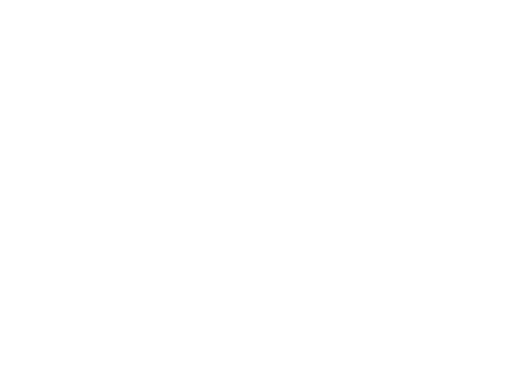

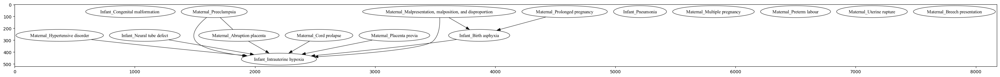

In [134]:
from causallearn.search.ConstraintBased.PC import pc

labels = [f'{col}' for i, col in enumerate(AphixiaCauses.columns)]
AphixiaCauses = AphixiaCauses.to_numpy()

cg = pc(AphixiaCauses)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.figure(figsize=(40,14))
plt.imshow(img)
plt.show()

In [145]:
AphixiaCauses=data4[['Infant_Congenital malformation ',"Infant_Intrauterine hypoxia",'Maternal_Hypertensive disorder',
               'Infant_Neural tube defect','Infant_Pneumonia','Maternal_Preeclampsia','Maternal_Abruption placenta',
               'Maternal_Multiple pregnancy','Maternal_Cord prolapse','Maternal_Preterm labour','Maternal_Prolonged pregnancy',
               'Maternal_Placenta previa','Maternal_Malpresentation, malposition, and disproportion','Maternal_Uterine rupture','Maternal_Breech presentation','Infant_Birth asphyxia'
              ]]

In [ ]:
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(AphixiaCauses)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)

In [141]:
#Import these to save the graph to file

import torch
from torchviz import make_dot
# use this function to save 
#------make_dot(model.adjacency_matrix_).render("test", format="png")----

In [150]:
#saving the graph to file
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(AphixiaCauses)

from causallearn.search.FCMBased.lingam.utils import make_dot
#make_dot(model.adjacency_matrix_, labels=labels)
fontsize=20
make_dot(model.adjacency_matrix_,labels=labels).render("attached1", format="png")

/Users/kasahunabdisa/anaconda3/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


'attached1.png'

In [ ]:
make_dot(r).render("attached", format="png")

In [ ]:
AphixiaFeature=data4[[Infant_Intrauterine hypoxia                                                       
Infant_Severe acute malnutrition                                                   
Infant_Sepsis                                                                      
Infant_Neural tube defect                                                          
Infant_Craniorachischisis                                                         
Infant_Preterm                                                                     
Infant_Respiratory distress syndrome                                               
Infant_Intrauterine growth restriction                                             
Infant_Pneumonia                                                                   
Infant_Low birth weight                                                            
Infant_Hydrocephalus                                                               
Infant_Congenital malformation                                                     
Infant_Meconium aspiration syndrome                                                
Infant_Hyaline membrane disease                                                    
Infant_Hydrops fetalis                                                             
Infant_Iniencephaly                                                                
Infant_Measles                                                                     
Infant_Gastroenteritis                                                             
Infant_Chromosomal abnormality                                                     
Infant_Intrauterine infection                                                      
Infant_Neonatal jaundice                                                           
Infant_Polycystic kidney disease                                                   
Infant_RH isoimmuzation                                                           
Infant_Portal Hypertension                                                         
Infant_Pneumonitis                                                                 
Infant_Infections of the skin and other subcutaneous tissue                        
Infant_Accidental suffocation and strangulation in bed                             
Infant_Extreme immaturity                                                          
Infant_Unspecified parasitic disease                                               
Infant_Osteochondrodysplasia with defects of growth of tubular bones and spine     
Infant_Light for Gestational Age                                                   
Infant_Hypoxic Ischemic Encephalopathy of Newborn                                  

In [ ]:
Maternal_Preeclampsia                                       
Maternal_Abruption placenta                                 
Maternal_Multiple pregnancy                                 
Maternal_Preterm rupture of membranes                     
Maternal_Malpresentation, malposition, and disproportion    
Maternal_Eclampsia                                         
Maternal_Antepartum hemorrhage                              
Maternal_Cord prolapse                                      
Maternal_Chorioamnionitis                                   
Maternal_Preterm labour                                    
Maternal_Breech presentation                                
Maternal_Uterine rupture                                    
Maternal_placental infarction                               
Maternal_Placenta previa                                    
Maternal_Hypertensive disorder                                                                    
Maternal_diabetes mellitus                                  
Maternal_Obstructed labor                                   
Maternal_RH Negative                                        
Maternal_Prolonged pregnancy                                
Maternal_Precipitated labour                                
Maternal_Maternal_HIV                                                
Maternal_oligohydramnios                                    
prolonged labour                                   
Maternal_twin-to-twin placental transfusion syndrome                                                        
Maternal_Chronic liver disease                              
Maternal_precipitate delivery                               


In [51]:
import graphviz
import networkx as nx

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [125]:
#asphixia Result analysis

asphixia=pd.read_csv('Result_Asphixia.csv')

In [88]:
asphixia.head(2)

,Risk Factors,Casual Impact on Asphixia,Placebo Accuracy Metric,Unnamed: 3
0,Intrauterine hypoxia,11.4,0.74,neg
1,Severe acute malnutrition,8.2,0.88,neg


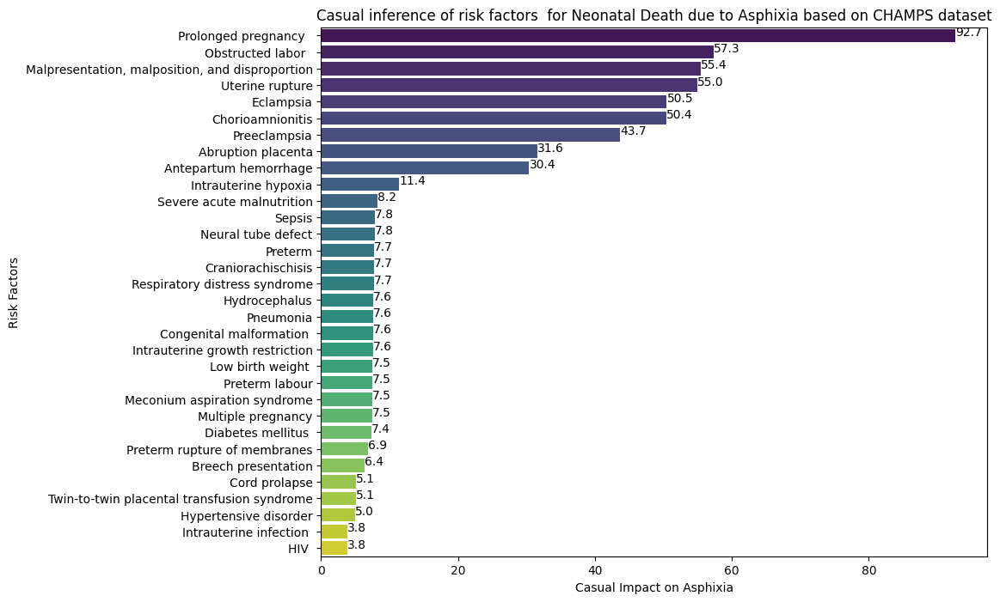

In [126]:
asphixia=asphixia.sort_values('Casual Impact on Asphixia',ascending=False)
plt.figure(figsize=(10,8))
sns.barplot(asphixia, x="Casual Impact on Asphixia", y="Risk Factors",palette='viridis').set_title('Casual inference of risk factors  for Neonatal Death due to Asphixia based on CHAMPS dataset')
y=asphixia['Casual Impact on Asphixia']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

In [92]:
rds=pd.read_csv('Result_RDS.csv')

In [43]:
rds.head(2)

,Risk Factor,Casual Impact on RDS,Placebo Accuracy Metric,Unnamed: 3
0,Intrauterine hypoxia,7.0,0.58,neg
1,Severe acute malnutrition,5.0,0.58,neg


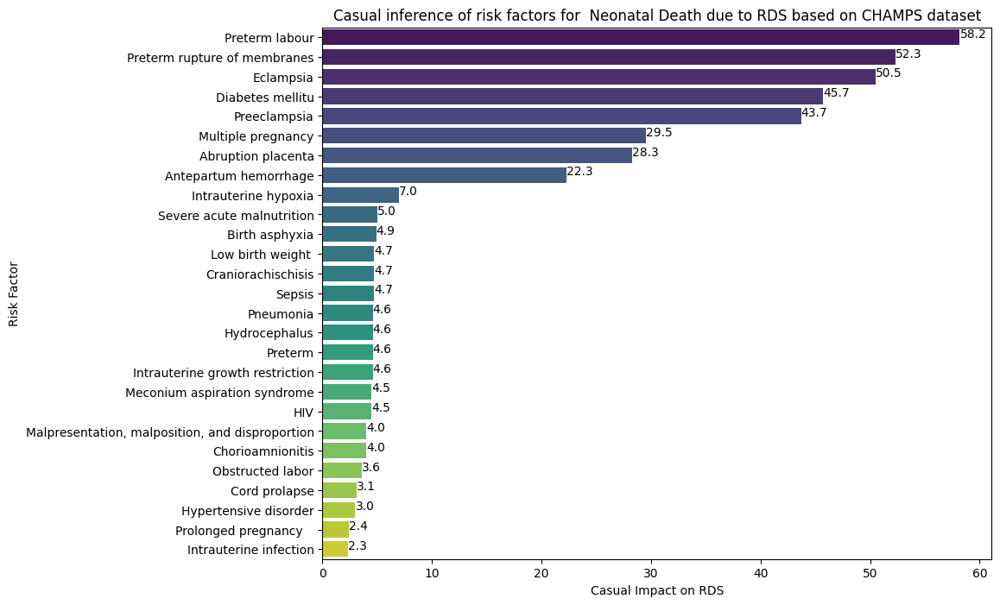

In [93]:
rds=rds.sort_values('Casual Impact on RDS',ascending=False)
plt.figure(figsize=(10,8))
sns.barplot(rds, x="Casual Impact on RDS", y="Risk Factor",palette='viridis').set_title('Casual inference of risk factors for  Neonatal Death due to RDS based on CHAMPS dataset')
y=rds['Casual Impact on RDS']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

In [ ]:
Result_sepsis.csv

In [100]:
sepsis=pd.read_csv('Result_sepsis.csv')

In [50]:
sepsis.head(2)

,Risk Factors,Casual Impact on Sepsis,Placebo Accuracy Metric,Unnamed: 3
0,Intrauterine hypoxia,6.6,0.92,neg
1,Severe acute malnutrition,4.7,0.92,neg


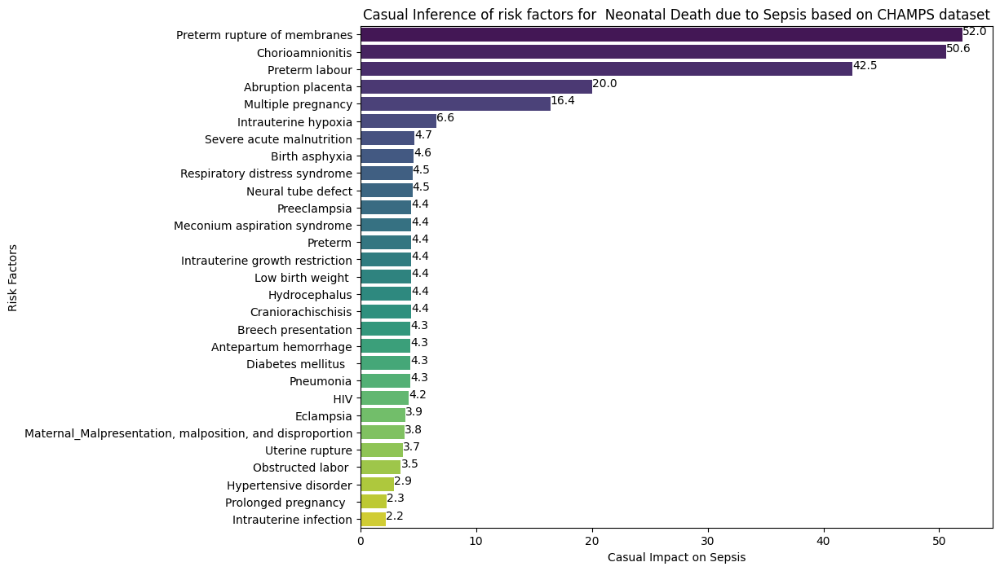

In [101]:
sepsis=sepsis.sort_values('Casual Impact on Sepsis',ascending=False)
plt.figure(figsize=(10,8))
sns.barplot(sepsis, x="Casual Impact on Sepsis", y="Risk Factors",palette='viridis').set_title('Casual Inference of risk factors for  Neonatal Death due to Sepsis based on CHAMPS dataset')
y=sepsis['Casual Impact on Sepsis']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()

In [122]:
intra=pd.read_csv('Result_Intrauterinehypoxia.csv')

In [123]:
intra.head(2)

,Risk Factors,Casual Impact on Intrauterine hypoxia,Placebo Accuracy Metric,Unnamed: 3
0,Cord prolapse,65.5,0.64,NaN
1,Birth asphyxia,38.0,0.54,neg


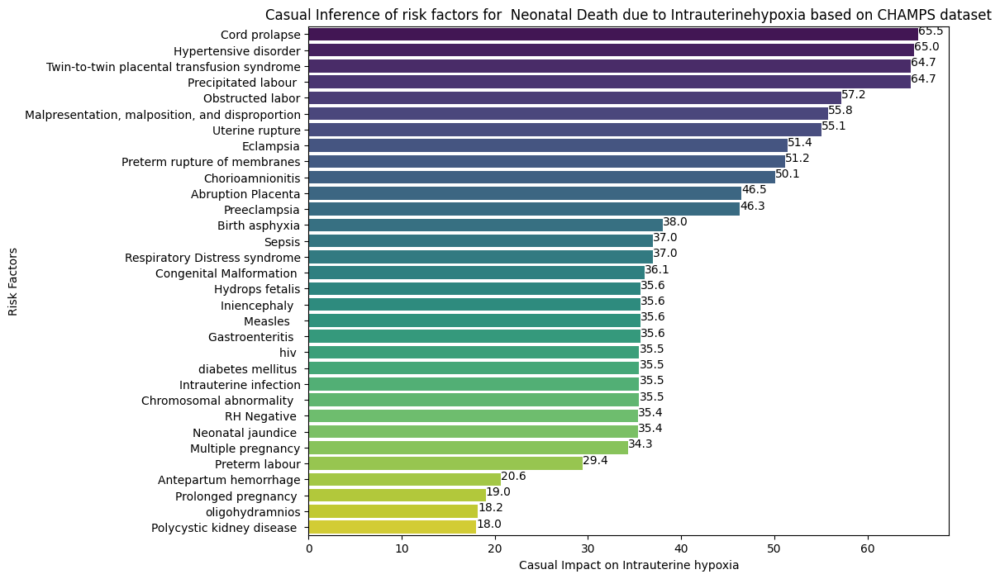

In [124]:
intra=intra.sort_values('Casual Impact on Intrauterine hypoxia',ascending=False)
plt.figure(figsize=(10,8))
sns.barplot(intra, x="Casual Impact on Intrauterine hypoxia", y="Risk Factors",palette='viridis').set_title('Casual Inference of risk factors for  Neonatal Death due to Intrauterinehypoxia based on CHAMPS dataset')
y=intra['Casual Impact on Intrauterine hypoxia']
for index, value in enumerate(y):
    plt.text(value, index,str(value))
plt.show()